# Introduction

This notebook will take you through some of the foundational elements of the Time Series analysis, Including various types of dataset's and how does Time Series Data differ from them, Inferrential Statistics pertaining to the Time Series data, Various graphical visualisation involved in the time series.

<b>Interesting Read : </b>[Engineering Statistics Handbook](https://www.itl.nist.gov/div898/handbook/index.htm)

<img src='../../Materials/Engineering Statistic Handbook - Cover.png' width='250' align='left'>
<br>
<br>
<br>
<br>
<br>
<br>
<br>
<br>
<br>
<br>
<br>
<br>
<br>
<br>
<br>
<br>
<br>

[R - Libraries : Some useful libraries and components for Time Series Analysis in R - by Rob.J.Hyndman](https://cran.r-project.org/web/views/TimeSeries.html)

# Imports

In [1041]:
# General
from warnings import filterwarnings
filterwarnings('ignore')
from cycler import cycler


# Data Wrangling
import pandas as pd
import numpy as np

# Data Viualization
import matplotlib.pyplot as plt
import seaborn as sns
import mplfinance as mpl

# Time Series Specific
from statsmodels.tsa.seasonal import seasonal_decompose


# Datetime
from datetime import datetime

# Path and Variable Initialisation

In [1525]:
root_path = '../../'
raw_datapath = root_path+'Raw Data/'
prepared_datapath = root_path+'Prepared Data/'

# Consumer Price Index for India with Groups and Subgroups
cpi_datapath = raw_datapath+'cpi_states_and_groups.csv'
# Total Air Passengers
airpassengers_datapath = raw_datapath+'AirPassengers.csv'
# Total Air Passengers
houseprices_datapath = raw_datapath+'Housing_data_prices.csv'
# Australlian Monthly Beer Production
beerprod_datapath = raw_datapath+'Australlian_Monthly_Beer_Production.csv'
# Britannia Stock Prices
britanniastock_datapath = raw_datapath+'BRITANNIA.NS.csv'
# Air Gap Data
airgap_datapath = raw_datapath+'airGap.csv'
# Housing Prices with Missing Data
housepmiss_datapath = raw_datapath+'housing-with-missing-value.csv'
# Monthly Milk production
milkprod_datapath = raw_datapath+'monthly-milk-production-pounds.csv'
# Population and Energy Consumption
popenergy_datapath = raw_datapath+'global_pop_energy.csv'
# USA CPI
usacpi_datapath = raw_datapath+'USA_CPI.csv'
# AntiDiabetic DrugSales
antidiabetic_datapath = raw_datapath+'AntiDiabetic_DrugSales_Mn.csv'
# Australlian Electricity Priduction
elecprod_datapath = raw_datapath+'Australlian_Monthly_Electricity_Production_BillionKWh.csv'
# AntiDiabetic DrugSales
antidiabetic_datapath = raw_datapath+'AntiDiabetic_DrugSales_Mn.csv'
# Australlian Visitors
visitors5r_datapath = raw_datapath+'Australlia_Vistors_5Regions_Million.csv'

In [592]:
plt.rcParams['figure.dpi'] = 100
plt.rcParams['figure.figsize'] = (15,7)
plt.style.use('dark_background')
# plt.style.use('ggplot')

# Reading Datasets

In [1527]:
cpi_data = pd.read_csv(cpi_datapath, header=[1])

airpassengers_data = pd.read_csv(airpassengers_datapath, index_col=0, parse_dates=True)

houseprices_data = pd.read_csv(houseprices_datapath, index_col=0)

beerprod_data = pd.read_csv(beerprod_datapath, index_col=0, parse_dates=True)

britanniastock_data = pd.read_csv(britanniastock_datapath, index_col=0, parse_dates=True)

housepmiss_data = pd.read_csv(housepmiss_datapath, index_col=0)

milkprod_data = pd.read_csv(milkprod_datapath, index_col=0)

popenergy_data = pd.read_csv(popenergy_datapath, index_col=0, parse_dates=True)

usacpi_data = pd.read_csv(usacpi_datapath, index_col=0, parse_dates=True)

visitors5r_data = pd.read_csv(visitors5r_datapath, index_col=0, parse_dates=True)

# Processing Data

## India - Consumer Price Index Data

In [192]:
cpi_data=cpi_data.reset_index()
cpi_data=cpi_data.drop(['index', 'Group', 'Sub Group', 'Status'], axis=1) # Unrequired Columns
cpi_data=cpi_data.dropna(how='all', axis=1)
cpi_data['Month']=pd.to_datetime(cpi_data.Month, format='%B').dt.month
cpi_data['Day']='01'
# Create Date
cpi_data['Date'] = pd.to_datetime(cpi_data[['Year', 'Month', 'Day']])
cpi_data.drop(['Year', 'Month', 'Day'], axis=1, inplace=True)
cpi_data.head()

,State,Description,Rural,Urban,Combined,Date
0,ALL India,Cereals and products,107.5,110.5,108.4,2013-01-01
1,Andhra Pradesh,Cereals and products,111.0,115.0,112.2,2013-01-01
2,Assam,Cereals and products,103.9,105.6,104.1,2013-01-01
3,Bihar,Cereals and products,107.3,110.2,107.6,2013-01-01
4,Chhattisgarh,Cereals and products,103.2,109.3,104.9,2013-01-01


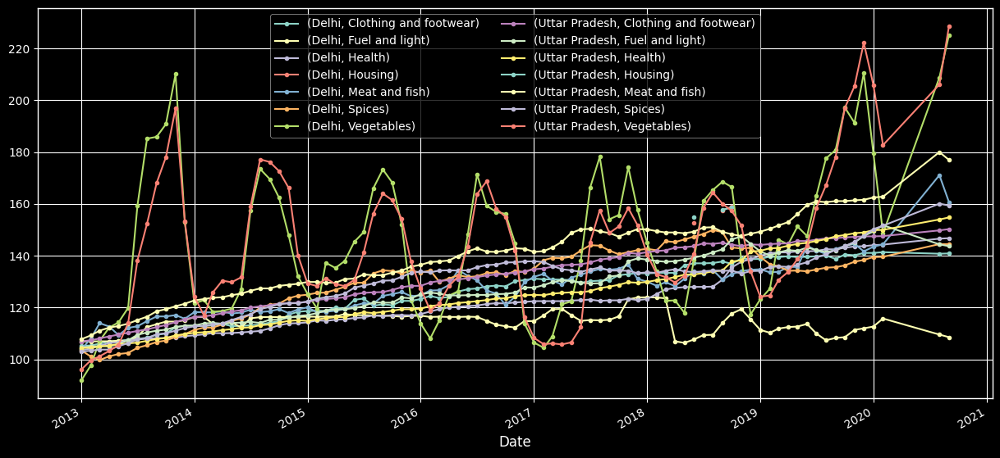

In [197]:
pltdata=cpi_data.set_index('Date').copy()
pltdata=pltdata[pltdata.State.isin(['Delhi', 'Uttar Pradesh'])]
pltdata=pltdata[pltdata.Description.isin(['Health', 'Meat and fish', 'Spices',
                                    'Clothing and footwear', 'Housing',
                                    'Fuel and light','Vegetables'])]

_=pltdata.groupby(['State', 'Description']).Combined.plot(legend=True, marker='o', markersize=3)
_=plt.legend(ncol=2)

## Air Passengers Data

In [855]:
pd.infer_freq(airpassengers_data.index)

'MS'

In [856]:
airpassengers_data.index=pd.PeriodIndex(airpassengers_data.index, freq='M')
airpassengers_data.index[:3]

PeriodIndex(['1949-01', '1949-02', '1949-03'], dtype='period[M]', name='Month', freq='M')

In [857]:
airpassengers_data.columns = ['Passengers']
airpassengers_data.head()

,Passengers
Month,
1949-01,112
1949-02,118
1949-03,132
1949-04,129
1949-05,121


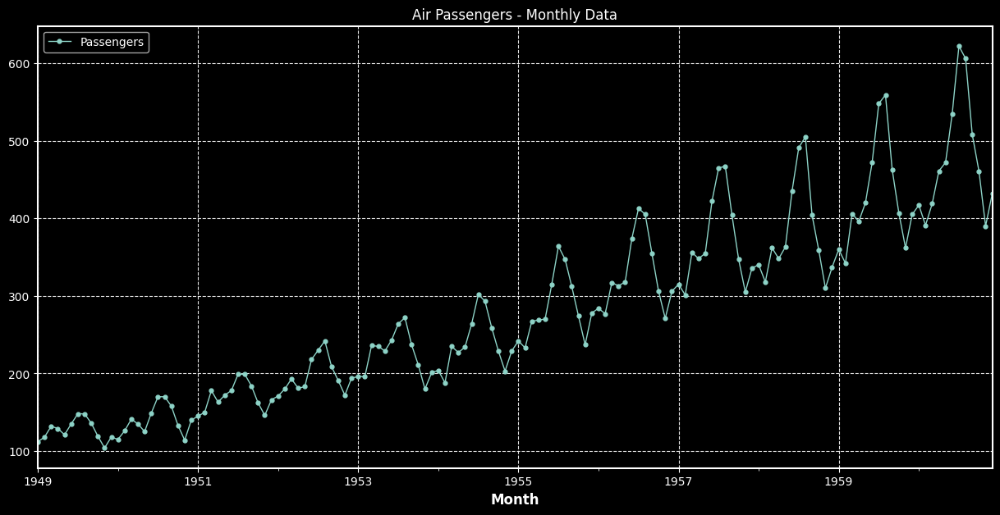

In [858]:
_=airpassengers_data.plot(marker='o', markersize=3.5,
                          title='Air Passengers - Monthly Data')

## Monthly Beer Production

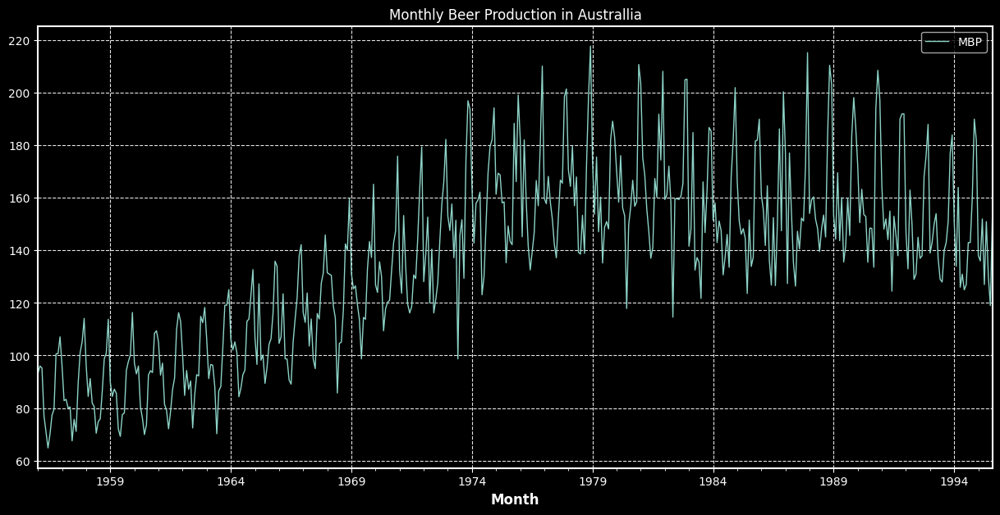

In [1882]:
beerprod_data.columns = ['MBP']
_=beerprod_data.plot(title='Monthly Beer Production in Australlia')

## Housing Prices Data

In [1355]:
houseprices_data = houseprices_data.drop(['RegionID', 'SizeRank', 'StateName'], axis=1)
houseprices_data = houseprices_data[~houseprices_data.RegionName.duplicated()]
houseprices_data = houseprices_data.melt(id_vars='RegionName')
houseprices_data.columns=['Region', 'Month', 'Price']
houseprices_data.head()

,Region,Month,Price
0,New York,2008-03,NaN
1,Los Angeles,2008-03,507600.0
2,Houston,2008-03,138400.0
3,Chicago,2008-03,325100.0
4,San Antonio,2008-03,130900.0


<b>Finding Those regions which are present in each month</b>

In [1356]:
persistent_regions = set(houseprices_data.Region.unique())
len(persistent_regions)

3158

In [1357]:
def find_regions(x):
    global persistent_regions
    persistent_regions = persistent_regions.difference(persistent_regions.difference(x))
_=houseprices_data.dropna().groupby('Month').Region.apply(set).apply(lambda x : find_regions(x))

In [1358]:
len(persistent_regions)

744

In [1359]:
print('Shape Before : ', houseprices_data.shape)
houseprices_data=houseprices_data[houseprices_data.Region.isin(persistent_regions)].copy()
print('Shape After : ', houseprices_data.shape)

Shape Before :  (457910, 3)
Shape After :  (107880, 3)


In [1360]:
houseprices_data.set_index(['Region', 'Month']).sort_index(level=0)

Price
Region   Month            
Abingdon 2008-03  261100.0
         2008-04  263700.0
         2008-05  248900.0
         2008-06  239300.0
         2008-07  232800.0
...                    ...
Zeeland  2019-11  219500.0
         2019-12  214900.0
         2020-01  222900.0
         2020-02  227600.0
         2020-03  233000.0

[107880 rows x 1 columns]

In [1361]:
houseprices_data.index = pd.PeriodIndex(houseprices_data.Month, freq='M')
houseprices_data.drop('Month', axis=1, inplace=True)
houseprices_data.head()

,Region,Price
Month,,
2008-03,Chicago,325100.0
2008-03,Las Vegas,244400.0
2008-03,Dallas,148400.0
2008-03,Columbus,116000.0
2008-03,Louisville,124800.0


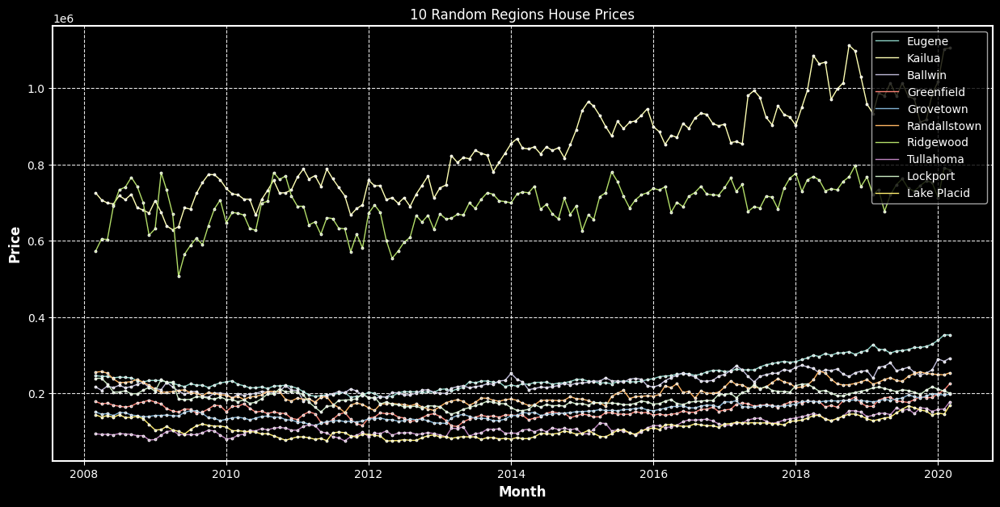

In [1362]:
pltdata = houseprices_data.copy()
random_regions = np.random.choice(pltdata.Region,10) # Pick 10 random regions
pltdata.index = pltdata.index.to_timestamp()
pltdata = pltdata[pltdata.Region.isin(random_regions)]
_=sns.lineplot(x='Month', y='Price', data=pltdata, hue='Region',
               marker='o', markersize=2)
_=plt.legend(loc=1)
_=plt.title('10 Random Regions House Prices')

## Britannia's Stock Prices

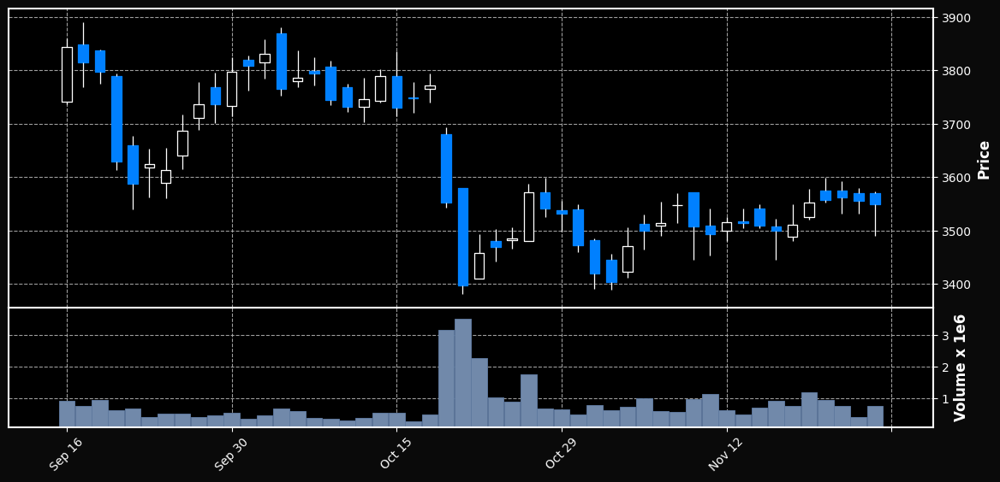

In [547]:
britanniastock_data = britanniastock_data[['Open', 'High', 'Low', 'Close', 'Volume']].copy()
britanniastock_data=britanniastock_data.dropna()
mpl.plot(britanniastock_data[-50:], figsize=(15,7),
         type='candle', volume=True, style='mike')


## Air Gap Data

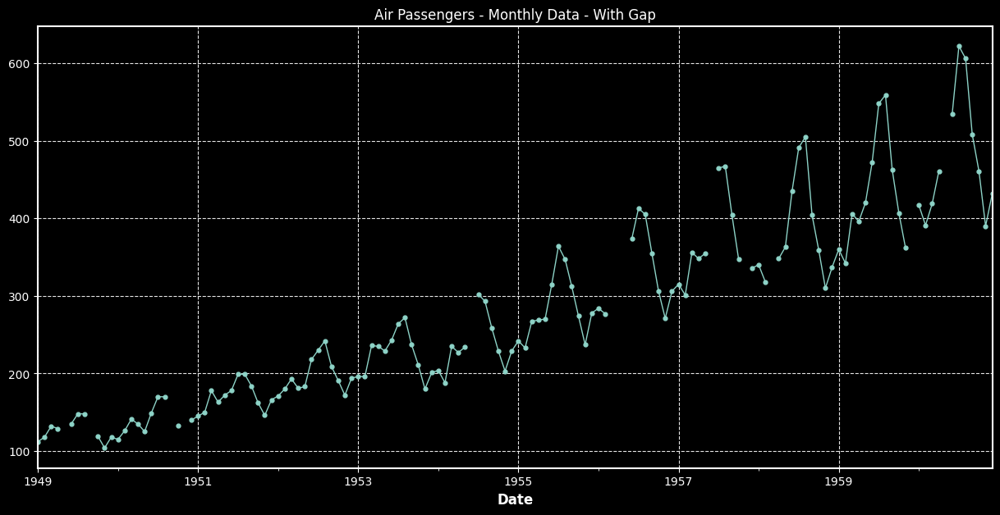

In [779]:
airgap_data = pd.read_csv(airgap_datapath, index_col=0, parse_dates=True)
airgap_data.columns = ['Passengers']
airgap_data.index.name = 'Date'
_=airgap_data.Passengers.plot(marker='o', markersize=3.5,
                              title='Air Passengers - Monthly Data - With Gap')

## Housing Data Gap

In [880]:
housepmiss_data = pd.read_csv(housepmiss_datapath, index_col=0)
housepmiss_data.head()

,crim,zn,indus,chas,nox,rm,age,dis,rad,tax,ptratio,b,lstat,medv
1,0.00632,18.0,2.31,0,0.538,6.575,65.2,4.0900,1.0,296,15.3,396.90,4.98,24.0
2,0.02731,0.0,7.07,0,0.469,6.421,78.9,4.9671,2.0,242,17.8,396.90,9.14,21.6
3,0.02729,0.0,7.07,0,0.469,7.185,61.1,4.9671,2.0,242,17.8,392.83,4.03,34.7
4,0.03237,0.0,2.18,0,0.458,6.998,45.8,6.0622,3.0,222,18.7,394.63,2.94,33.4
5,0.06905,0.0,2.18,0,0.458,7.147,54.2,6.0622,3.0,222,18.7,396.90,5.33,36.2


## Milk Production Dataset

In [1865]:
milkprod_data.columns = ['MilkProductionPounds']
milkprod_data.index = pd.to_datetime(milkprod_data.index)
milkprod_data.head()

,MilkProductionPounds
Month,
1962-01-01,589
1962-02-01,561
1962-03-01,640
1962-04-01,656
1962-05-01,727


<AxesSubplot:xlabel='Month'>

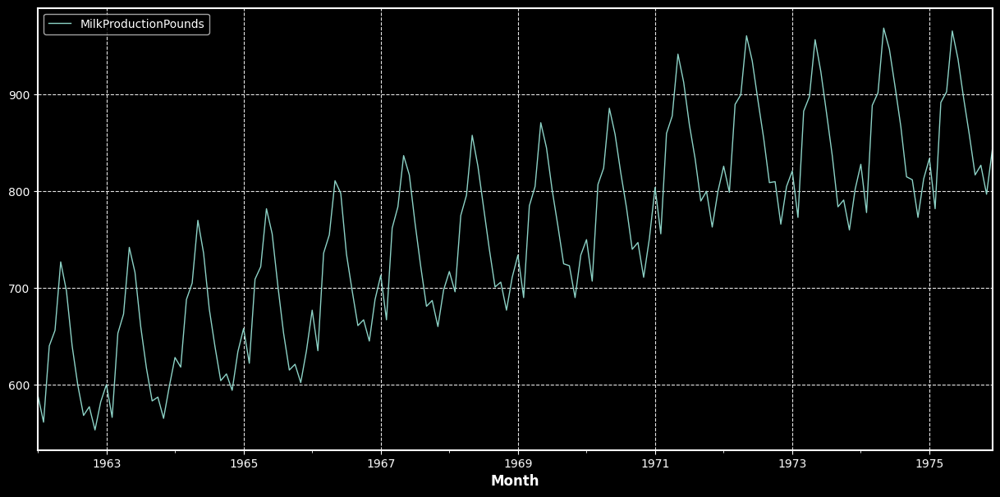

In [1866]:
milkprod_data.plot()

## Global Population and Energy Consumption Data

In [1233]:
popenergy_data.head()

,Population,Coal_TWh,Oil_TWh,Gas_TWh,Hydropower_TWh,Nuclear_TWh,Solar_TWh,OtherRenewables_TWh,TraditionalBiomass_TWh,Wind_TWh,Biofuels_TWh
1960-01-01,3.067248e+10,15442,11097,4472,689,0,0,0,8889,0,0
1965-01-01,3.372133e+10,16140,18109,6303,923,26,0,18,9162,0,0
1966-01-01,3.446703e+10,16324,19496,6869,984,34,0,20,9218,0,0
1967-01-01,3.520994e+10,16061,20891,7375,1006,41,0,20,9274,0,0
1968-01-01,3.596666e+10,16301,22675,8044,1059,52,0,22,9331,0,0


In [1234]:
popenergy_data['Renewable_Energy_TWh'] = popenergy_data[['Hydropower_TWh', 'Solar_TWh',
                                                        'OtherRenewables_TWh', 'TraditionalBiomass_TWh',
                                                        'Wind_TWh', 'Biofuels_TWh']].sum(axis=1)
popenergy_data['NonRenewable_Energy_TWh'] = popenergy_data[['Coal_TWh', 'Oil_TWh', 'Gas_TWh']].sum(axis=1)
popenergy_data['Nuclear_Energy_TWh'] = popenergy_data[['Nuclear_TWh']]
popenergy_data = popenergy_data[['Population', 'Renewable_Energy_TWh', 'NonRenewable_Energy_TWh', 'Nuclear_Energy_TWh']]
popenergy_data.head()

,Population,Renewable_Energy_TWh,NonRenewable_Energy_TWh,Nuclear_Energy_TWh
1960-01-01,3.067248e+10,9578,31011,0
1965-01-01,3.372133e+10,10103,40552,26
1966-01-01,3.446703e+10,10222,42689,34
1967-01-01,3.520994e+10,10300,44327,41
1968-01-01,3.596666e+10,10412,47020,52


## USA Consumer Price Index

In [1363]:
usacpi_data.index.name = 'Date'
usacpi_data.columns = ['CPI']
usacpi_data.head()

,CPI
Date,
2007-10-01,209.190
2007-11-01,210.834
2007-12-01,211.445
2008-01-01,212.174
2008-02-01,212.687


<AxesSubplot:xlabel='Date'>

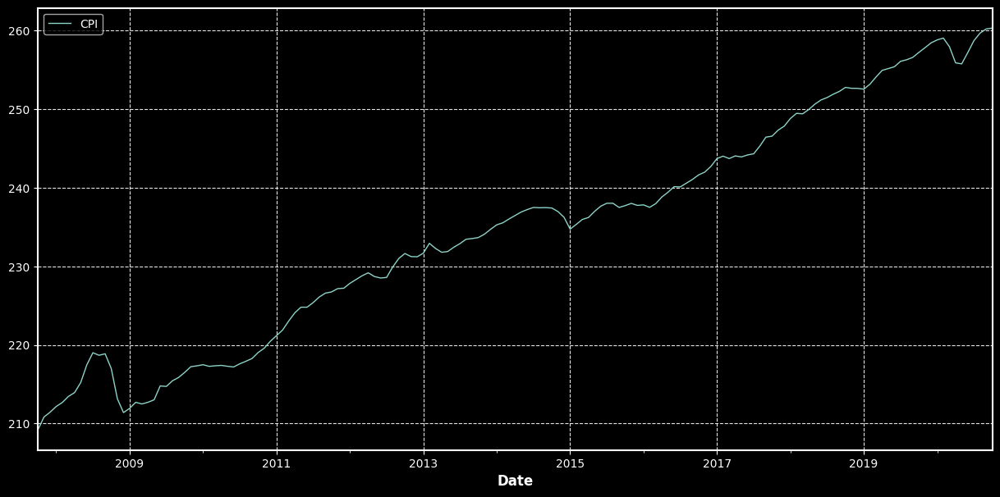

In [1364]:
usacpi_data.plot()

## AntiDiabetic DrugSales

In [1896]:
antidiabetic_data = pd.read_csv(antidiabetic_datapath, index_col=0, parse_dates=True)
antidiabetic_data.head()

,value
index,
1991-07-01,3.526591
1991-08-01,3.180891
1991-09-01,3.252221
1991-10-01,3.611003
1991-11-01,3.565869


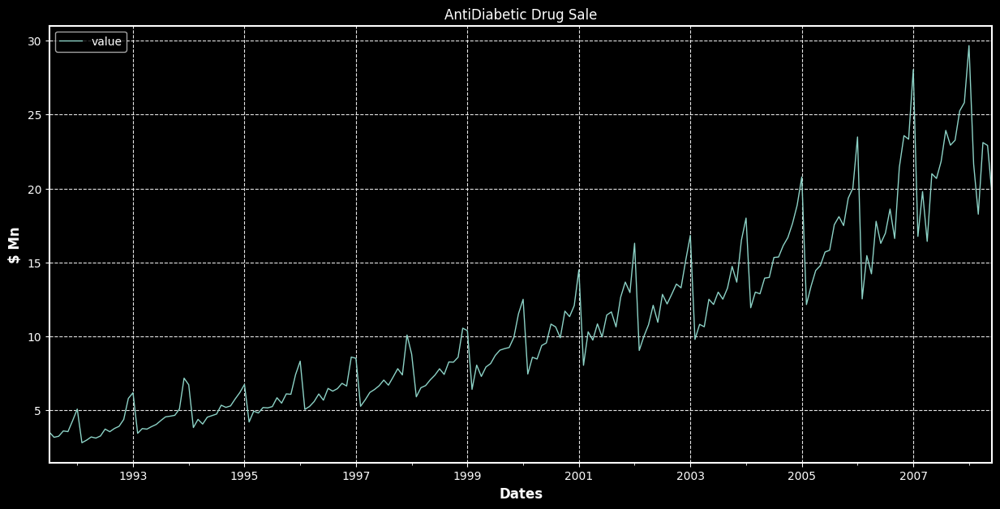

In [1897]:
_=antidiabetic_data.plot(title='AntiDiabetic Drug Sale')
_=plt.ylabel('$ Mn')
_=plt.xlabel('Dates')

## Australlian Electricity Priduction

In [1337]:
elecprod_data = pd.read_csv(elecprod_datapath, index_col=0, parse_dates=True)
elecprod_data.head()

,value
index,
1956-01-01,1254
1956-02-01,1290
1956-03-01,1379
1956-04-01,1346
1956-05-01,1535


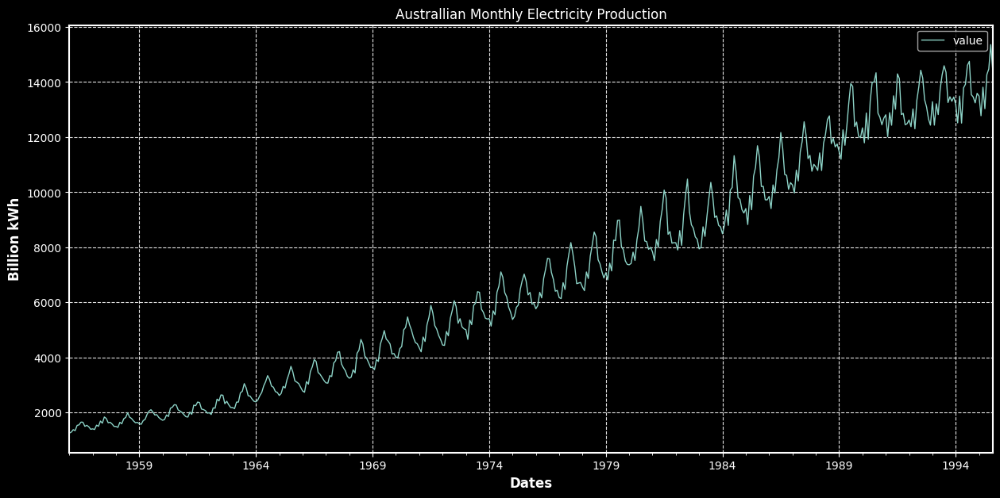

In [1342]:
_=elecprod_data.plot(title='Australlian Monthly Electricity Production')
_=plt.ylabel('Billion kWh')
_=plt.xlabel('Dates')

## Australlia Visitors - 5 Regions

In [1544]:
visitors5r_data.index=pd.to_datetime(visitors5r_data.index.str.replace(' ',''))
visitors5r_data.columns = ['Regions', 'Visitors']
visitors5r_data.head()

,Regions,Visitors
index,,
1998-01-01,NSWMetro,9.047095
1998-04-01,NSWMetro,6.962126
1998-07-01,NSWMetro,6.871963
1998-10-01,NSWMetro,7.147293
1999-01-01,NSWMetro,7.956923


# Different Types of Data

 - Time Series Data : Data collected against a ***Single feature*** across an equally spaced time span.
 
 - Cross-Sectional Data : Data collected against ***Multiple features*** at a single point in time.
 
 - Panel Data : Recording data for ***Multiple features at eaqually spaced time intervals***

In [65]:
cpi_data.head()

,Year,Month,State,Group,Sub Group,Description,Rural,Urban,Combined,Status,Unnamed: 10
0,2013,January,ALL India,1.0,1.1.01,Cereals and products,107.5,110.5,108.4,F,NaN
1,2013,January,Andhra Pradesh,1.0,1.1.01,Cereals and products,111.0,115.0,112.2,F,NaN
2,2013,January,Assam,1.0,1.1.01,Cereals and products,103.9,105.6,104.1,F,NaN
3,2013,January,Bihar,1.0,1.1.01,Cereals and products,107.3,110.2,107.6,F,NaN
4,2013,January,Chhattisgarh,1.0,1.1.01,Cereals and products,103.2,109.3,104.9,F,NaN


<b>Time Series Data</b>

Notice the `Object` for data recording here is `State`, and the remainder are features.

Q) Can you tell what are the features of this dataset then?

In [67]:
tsdata = cpi_data[cpi_data.State.isin(['Delhi'])].copy()
tsdata = tsdata[:10].reset_index().drop('index', axis=1)
tsdata = tsdata.style.set_caption('Time Series Data') # Giving your data frame a title
tsdata

,State,Description,Rural,Urban,Combined,Date
0,Delhi,Cereals and products,106.300000,105.700000,105.800000,2013-01-01 00:00:00
1,Delhi,Cereals and products,106.900000,107.300000,107.300000,2013-02-01 00:00:00
2,Delhi,Cereals and products,107.100000,107.500000,107.500000,2013-03-01 00:00:00
3,Delhi,Cereals and products,108.200000,107.600000,107.700000,2013-04-01 00:00:00
4,Delhi,Cereals and products,108.300000,108.500000,108.500000,2013-05-01 00:00:00
5,Delhi,Cereals and products,109.500000,109.700000,109.700000,2013-06-01 00:00:00
6,Delhi,Cereals and products,111.200000,110.900000,110.900000,2013-07-01 00:00:00
7,Delhi,Cereals and products,112.600000,111.000000,111.100000,2013-08-01 00:00:00
8,Delhi,Cereals and products,112.200000,110.900000,111.000000,2013-09-01 00:00:00
9,Delhi,Cereals and products,112.800000,111.400000,111.500000,2013-10-01 00:00:00


<b>Cross Sectional Data</b>

Notice the `Object` for data recording here is `State->Description`, and the remainder are features.


In [68]:
csdata = cpi_data[cpi_data.Date.isin(['2013-01-01'])].copy()
csdata = csdata[csdata.State.isin(['Delhi'])][:10]
csdata = csdata[:10].reset_index().drop('index', axis=1)
csdata = csdata.style.set_caption('Cross Sectional Data') # Giving your data frame a title
csdata

,State,Description,Rural,Urban,Combined,Date
0,Delhi,Cereals and products,106.300000,105.700000,105.800000,2013-01-01 00:00:00
1,Delhi,Meat and fish,106.500000,103.700000,103.900000,2013-01-01 00:00:00
2,Delhi,Egg,114.600000,116.400000,116.300000,2013-01-01 00:00:00
3,Delhi,Milk and products,104.300000,103.900000,103.900000,2013-01-01 00:00:00
4,Delhi,Oils and fats,105.700000,102.400000,102.700000,2013-01-01 00:00:00
5,Delhi,Fruits,93.400000,101.500000,101.200000,2013-01-01 00:00:00
6,Delhi,Vegetables,93.800000,91.700000,91.900000,2013-01-01 00:00:00
7,Delhi,Pulses and products,111.000000,108.000000,108.300000,2013-01-01 00:00:00
8,Delhi,Sugar and confectionery,106.900000,106.900000,106.900000,2013-01-01 00:00:00
9,Delhi,Spices,106.700000,103.200000,103.500000,2013-01-01 00:00:00


<b>Panel Data</b>

Notice the `Object` for data recording here is `State->Description`, and the remainder are features.



In [69]:
csdata = cpi_data[cpi_data.Date.isin(['2013-01-01', '2013-02-01'])].copy()
csdata = csdata[csdata.State.isin(['Delhi'])][:10]
csdata = csdata[:10].reset_index().drop('index', axis=1)
csdata = csdata.style.set_caption('Panel Data') # Giving your data frame a title
csdata

,State,Description,Rural,Urban,Combined,Date
0,Delhi,Cereals and products,106.300000,105.700000,105.800000,2013-01-01 00:00:00
1,Delhi,Cereals and products,106.900000,107.300000,107.300000,2013-02-01 00:00:00
2,Delhi,Meat and fish,106.500000,103.700000,103.900000,2013-01-01 00:00:00
3,Delhi,Meat and fish,112.800000,107.800000,108.100000,2013-02-01 00:00:00
4,Delhi,Egg,114.600000,116.400000,116.300000,2013-01-01 00:00:00
5,Delhi,Egg,113.700000,115.200000,115.100000,2013-02-01 00:00:00
6,Delhi,Milk and products,104.300000,103.900000,103.900000,2013-01-01 00:00:00
7,Delhi,Milk and products,104.300000,104.200000,104.200000,2013-02-01 00:00:00
8,Delhi,Oils and fats,105.700000,102.400000,102.700000,2013-01-01 00:00:00
9,Delhi,Oils and fats,106.000000,101.400000,101.800000,2013-02-01 00:00:00


# Time Series Related Operations

 - Windows
 - Lags
 - Resampling
 - Differencing
 - Percentage Change
 - Imputation
 - Outlier Detection - #TODO


## Windows

- <b>Rolling Window</b> : Shifting a specified width window over the dataset.

- <b>Expanding Window</b> : Dynamic sized window that changes its window length in tandem with the dates, keeping the data from begining to the latest date, chronologically, in the window


<b>Rolling Window</b>

In [211]:
rolling_data = airpassengers_data.copy()

<AxesSubplot:xlabel='Month'>

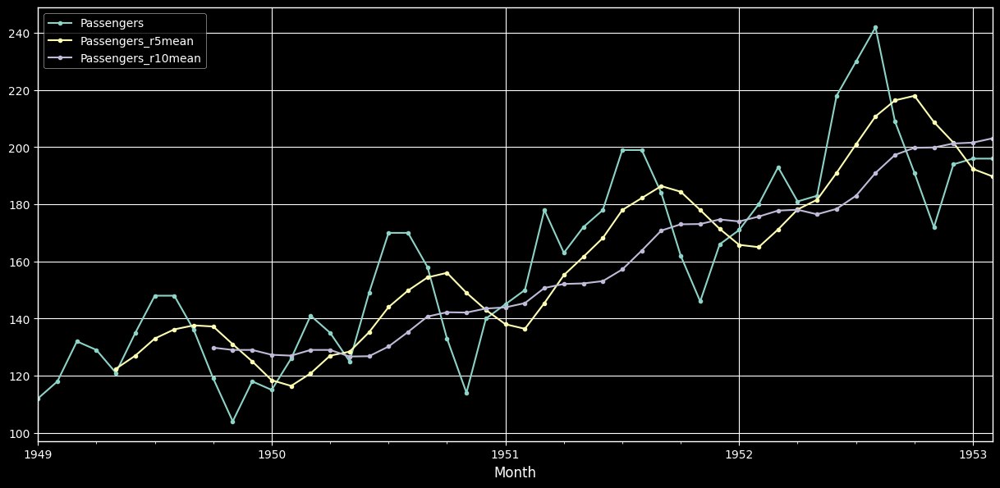

In [221]:
rolling_data['Passengers_r5mean'] = rolling_data.Passengers.rolling(5).mean()
rolling_data['Passengers_r10mean'] = rolling_data.Passengers.rolling(10).mean()
rolling_data[:50].plot(marker='o', markersize=3)

<b>Rolling Window</b> - Window Type

[scipy - Different Window Types](https://docs.scipy.org/doc/scipy/reference/signal.windows.html#module-scipy.signal.windows)

<img src='https://docs.scipy.org/doc/scipy/reference/_images/scipy-signal-windows-exponential-1_00.png' width='250' align='left'>

<img src='https://docs.scipy.org/doc/scipy/reference/_images/scipy-signal-windows-triang-1_00.png' width='250' align='left'>

<img src='https://docs.scipy.org/doc/scipy/reference/_images/scipy-signal-windows-gaussian-1_00.png' width='250' align='left'>



In [223]:
rolling_data = airpassengers_data.copy()

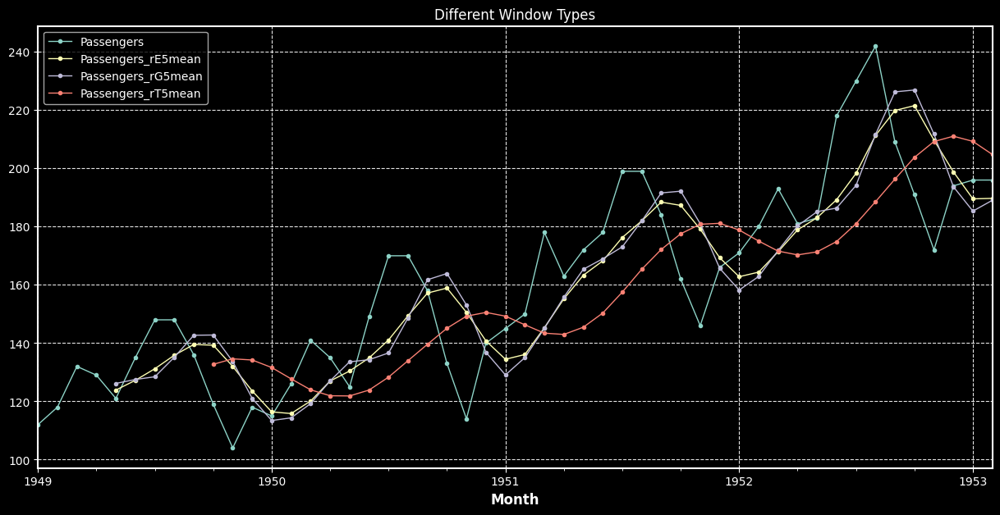

In [890]:
rolling_data['Passengers_rE5mean'] = rolling_data.Passengers.rolling(5, win_type='exponential').mean(tau=3)
rolling_data['Passengers_rG5mean'] = rolling_data.Passengers.rolling(5, win_type='gaussian').mean(std=1)
rolling_data['Passengers_rT5mean'] = rolling_data.Passengers.rolling(10, win_type='triang').mean()
_=rolling_data[:50].plot(marker='o', markersize=3, title='Different Window Types')

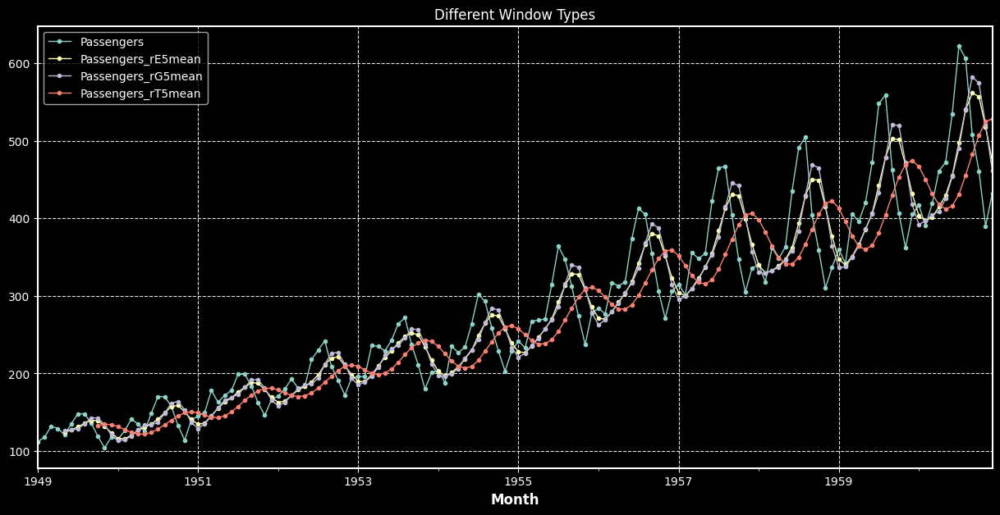

In [891]:
_=rolling_data.plot(marker='o', markersize=3, title='Different Window Types')

<b>Expanding Window</b>

In [235]:
expanding_data = airpassengers_data.copy()

Will there be any difference between the different windows for expanding windows?

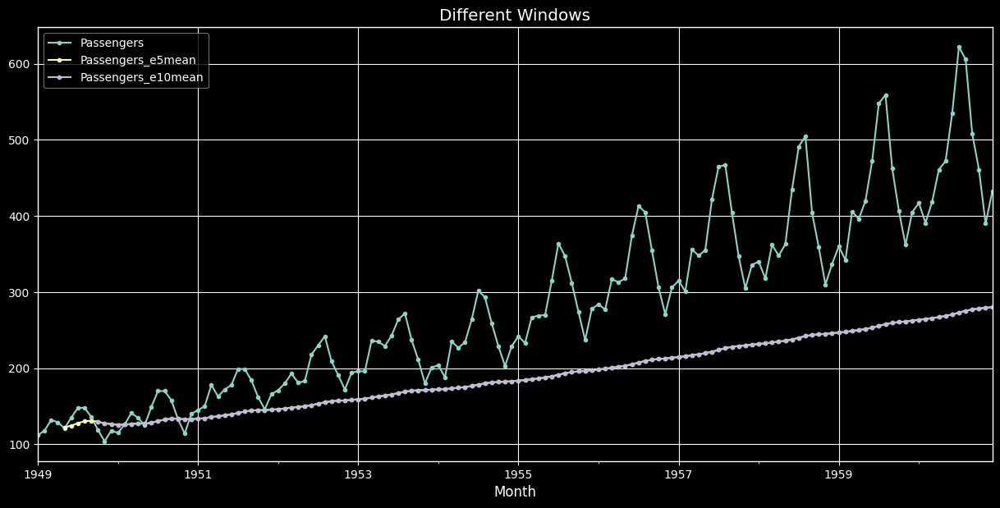

In [246]:
expanding_data['Passengers_e5mean'] = expanding_data.Passengers.expanding(5).mean()
expanding_data['Passengers_e10mean'] = expanding_data.Passengers.expanding(10).mean()
_=expanding_data.plot(marker='o', markersize=3, title='Different Windows')

Take a moment and think when is it that you will use Expanding Window and Rolling Window?
- Example Maximum DD uptil now, in a Trading Strategy.

## Lags

Since the time series data is collected over a period of time, datapoints adjacent of `Timestamps` might have relation with one another, hence it becomes appropriate to consider the `Lagged` values of time series in your analysis

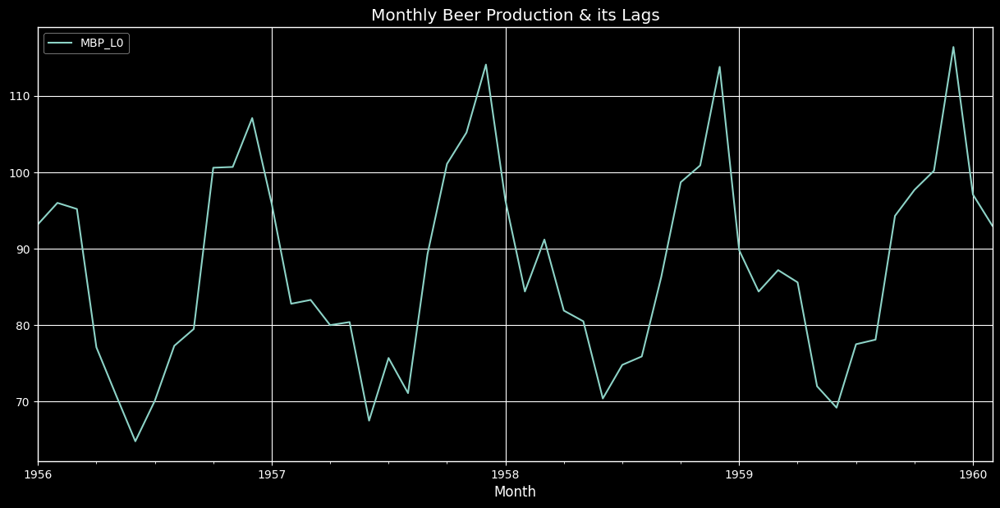

In [527]:
lagdata = beerprod_data.copy()
lagdata.columns = ['MBP_L0']
# lagdata['MBP_L1']  = lagdata.MBP_L0.shift(1)
# lagdata['MBP_L6']  = lagdata.MBP_L0.shift(6)
# lagdata['MBP_L12'] = lagdata.MBP_L0.shift(12)
# lagdata['MBP_L24'] = lagdata.MBP_L0.shift(24)
_=lagdata.dropna()[:50].plot(title='Monthly Beer Production & its Lags')

## Resampling
Changing frequency of the time series dataset, and applying aggregation functions over them

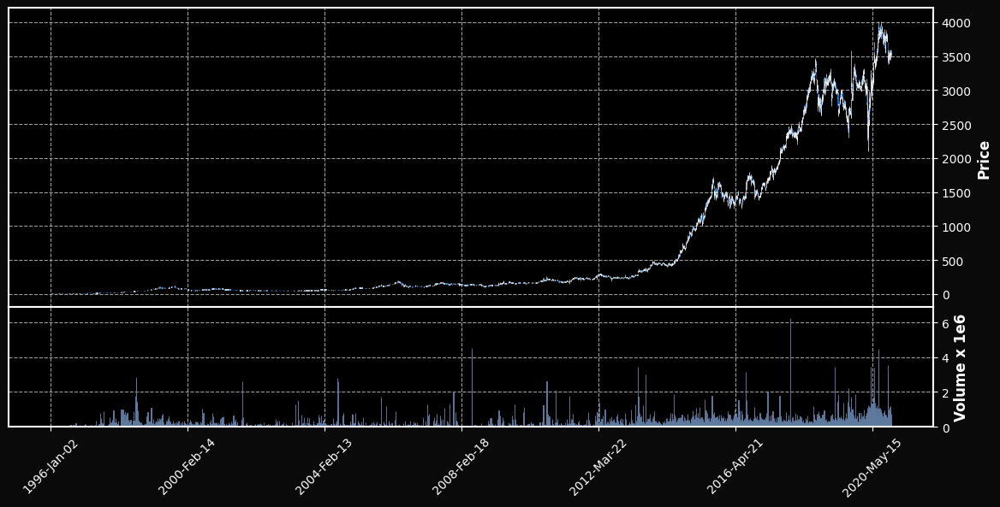

In [569]:
resampled_data = britanniastock_data.resample('2M').agg({'Open':'first',
                                                          'High':'max',
                                                          'Low':'min',
                                                          'Close':'last',
                                                          'Volume':'sum'})
mpl.plot(britanniastock_data, figsize=(15,7),
         type='candle', volume=True, style='mike')

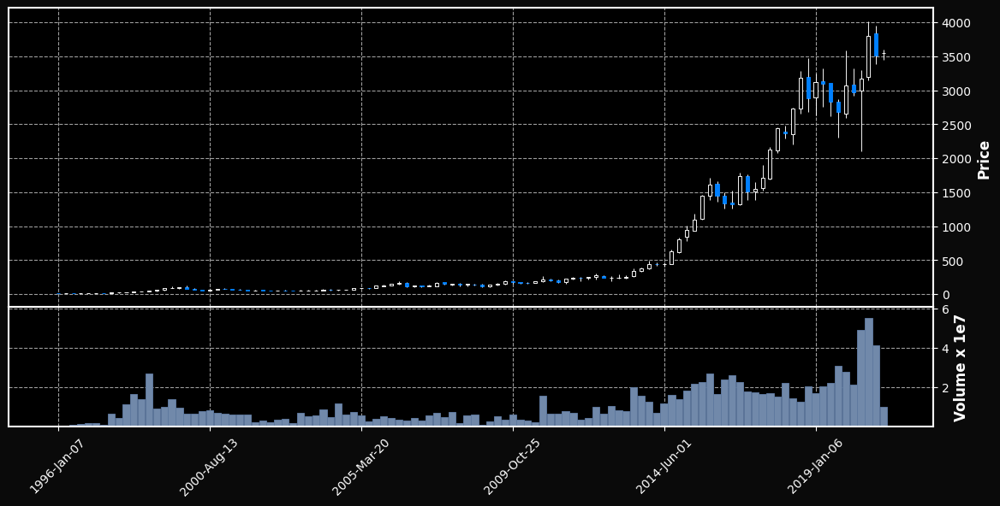

In [581]:
resampled_data = britanniastock_data.resample('12W', label='right').agg({'Open':'first',
                                                                        'High':'max',
                                                                        'Low':'min',
                                                                        'Close':'last',
                                                                        'Volume':'sum'})
mpl.plot(resampled_data, figsize=(15,7),
         type='candle', volume=True, style='mike')

In [579]:
britanniastock_data.resample('2W', label='right').agg({'Open':'first',
                                                          'High':'max',
                                                          'Low':'min',
                                                          'Close':'last',
                                                          'Volume':'sum'})

,Open,High,Low,Close,Volume
Date,,,,,
1996-01-07,10.600000,10.666700,10.46670,10.473300,10500.0
1996-01-21,10.333300,10.533300,9.46667,9.866670,12000.0
1996-02-04,9.833330,11.466700,9.60000,11.466700,45000.0
1996-02-18,11.466700,13.666700,11.46670,12.700000,126000.0
1996-03-03,12.666700,13.666700,12.66670,13.333300,160500.0
...,...,...,...,...,...
2020-10-11,3710.899902,3879.949951,3689.00000,3745.100098,4149742.0
2020-10-25,3769.100098,3835.949951,3382.00000,3469.750000,12479419.0
2020-11-08,3482.000000,3599.800049,3390.00000,3513.550049,8129624.0


## Differencing & Percentage Change

 - Differencing : Taking a <b>difference of the value at $t_{i}$ with $t_{i-n}$</b>, where n is the period
 - Percentage Change : <b>Change observed in the value at $t_{i}$ w.r.t $t_{i-n}$</b>, where n is the period


In [612]:
chicago_prices = houseprices_data[houseprices_data.Region=='Chicago'].copy()
chicago_prices.drop(['Region'], axis=1, inplace=True)
chicago_prices['Price_diffP1'] = chicago_prices.Price.diff(1)
chicago_prices['Price_diffP2'] = chicago_prices.Price.diff(2)

chicago_prices['Price_pctP1'] = chicago_prices.Price.pct_change(1)
chicago_prices['Price_pctP2'] = chicago_prices.Price.pct_change(2)
chicago_prices = chicago_prices.dropna()
chicago_prices.index = chicago_prices.index.to_timestamp()
chicago_prices.head()

,Price,Price_diffP1,Price_diffP2,Price_pctP1,Price_pctP2
Month,,,,,
2008-05-01,286900.0,-27900.0,-38200.0,-0.088628,-0.117502
2008-06-01,274600.0,-12300.0,-40200.0,-0.042872,-0.127700
2008-07-01,268500.0,-6100.0,-18400.0,-0.022214,-0.064134
2008-08-01,264400.0,-4100.0,-10200.0,-0.015270,-0.037145
2008-09-01,267100.0,2700.0,-1400.0,0.010212,-0.005214


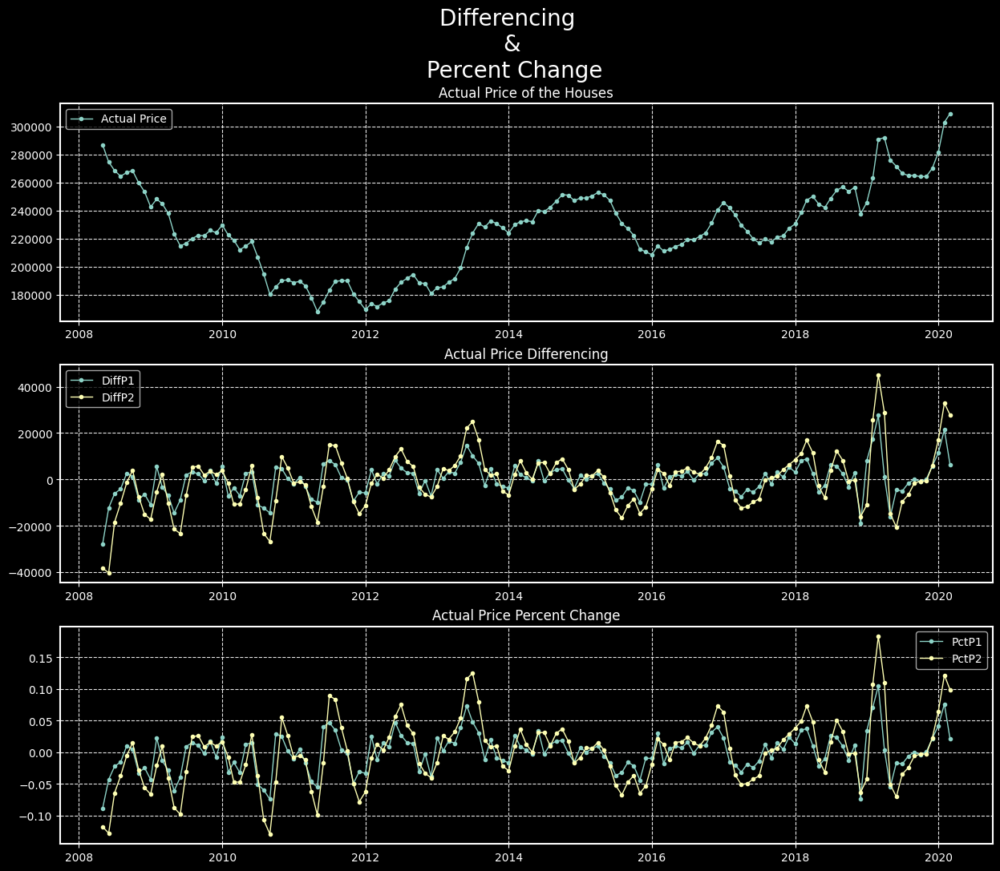

In [640]:
fig,axes = plt.subplots(3,1,figsize=(15,12))
_=axes[0].plot(chicago_prices.Price, marker='o', markersize=3, label='Actual Price')
_=axes[0].legend()
_=axes[0].set_title('Actual Price of the Houses')

_=axes[1].plot(chicago_prices.Price_diffP1, marker='o', markersize=3, label='DiffP1')
_=axes[1].plot(chicago_prices.Price_diffP2, marker='o', markersize=3, label='DiffP2')
_=axes[1].legend()
_=axes[1].set_title('Actual Price Differencing')

_=axes[2].plot(chicago_prices.Price_pctP1, marker='o', markersize=3, label='PctP1')
_=axes[2].plot(chicago_prices.Price_pctP2, marker='o', markersize=3, label='PctP2')
_=axes[2].legend()
_=axes[2].set_title('Actual Price Percent Change')

_=fig.suptitle('Differencing \n&\n Percent Change', fontsize=20)


## Imputation

Simply put, Filling in the Missing Values.

- fillna - Static Value Imputation
- bfill - Backward Fill
- ffill - Forward Fill
- interpolate - `spline`, `polynomial`, `linear`, `quadratic`, `barycentric`, `pchip`, `akima`, 
- rfimpute - Random Forest Imputation
- kNN - K Nearest Neighbours
- PoP Imputation - Period Over Period Imputation

NOTE : Be wary while usgin `polynomial` interpolation as it can induce ocsillations in the dataset, a phenomenon known as [Runge's phenomenon](https://en.wikipedia.org/wiki/Runge%27s_phenomenon)

<b>Interesting Read</b> : [Working with Missing Data](https://pandas.pydata.org/pandas-docs/stable/user_guide/missing_data.html#filling-with-a-pandasobject)


<b>Filling a Static Value for the NaN columns</b>

In [822]:
def get_uv_impplot(data, title):
    data=data.reset_index().copy()
    fig, axes = plt.subplots()
    from matplotlib.cm import get_cmap
    name = "Pastel1"
    cmap = get_cmap(name)
    colors = cmap.colors
    axes.set_prop_cycle(color=colors)
    for ecol in [k for k in data.columns if 'Imputed' in k]:
        sns.lineplot(x='Date', y=ecol, data=data, label=ecol,
                     linestyle='-.', marker='o', markersize=3, ax=axes)
    sns.lineplot(x='Date', y='Actual', data=data, label='Actual',
                 color='b', linestyle='-.', marker='o', markersize=3, ax=axes)
    axes.set_title(title)
    plt.close()
    return fig

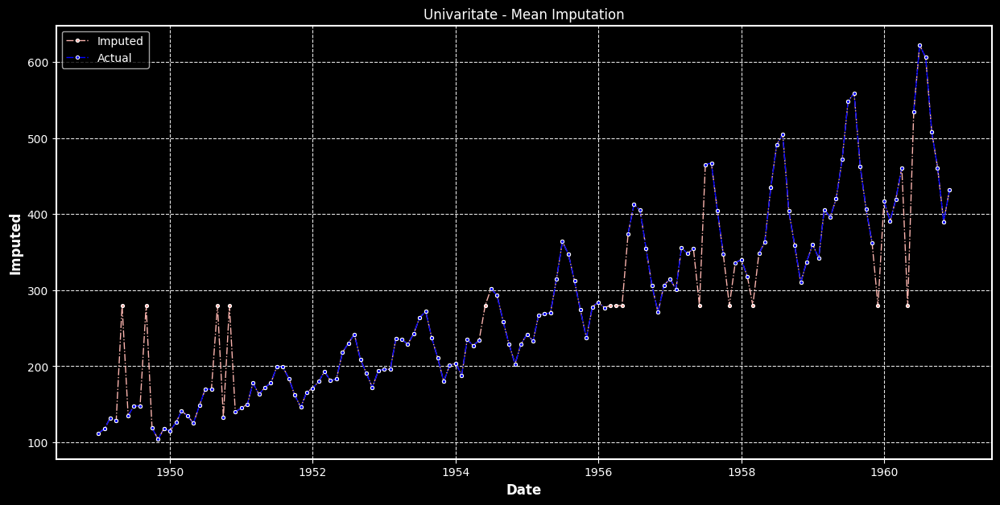

In [823]:
fillna_imputeUV = airgap_data.copy()
fillna_imputeUV.columns=['Actual']
fillna_imputeUV['Imputed'] = fillna_imputeUV.fillna(fillna_imputeUV.Actual.mean())

get_uv_impplot(fillna_imputeUV, title='Univaritate - Mean Imputation')

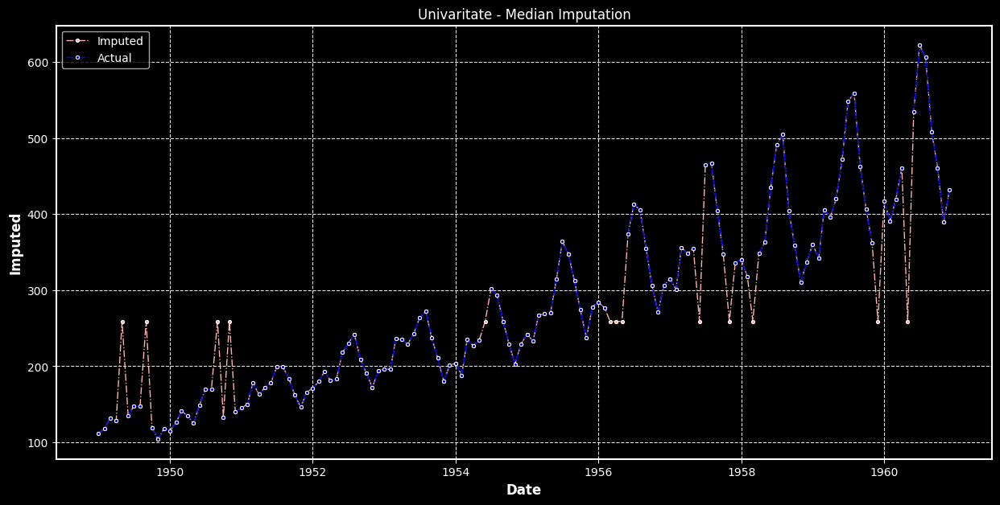

In [824]:
fillna_imputeUV = airgap_data.copy()
fillna_imputeUV.columns=['Actual']
fillna_imputeUV['Imputed'] = fillna_imputeUV.fillna(fillna_imputeUV.Actual.median())

get_uv_impplot(fillna_imputeUV, title='Univaritate - Median Imputation')

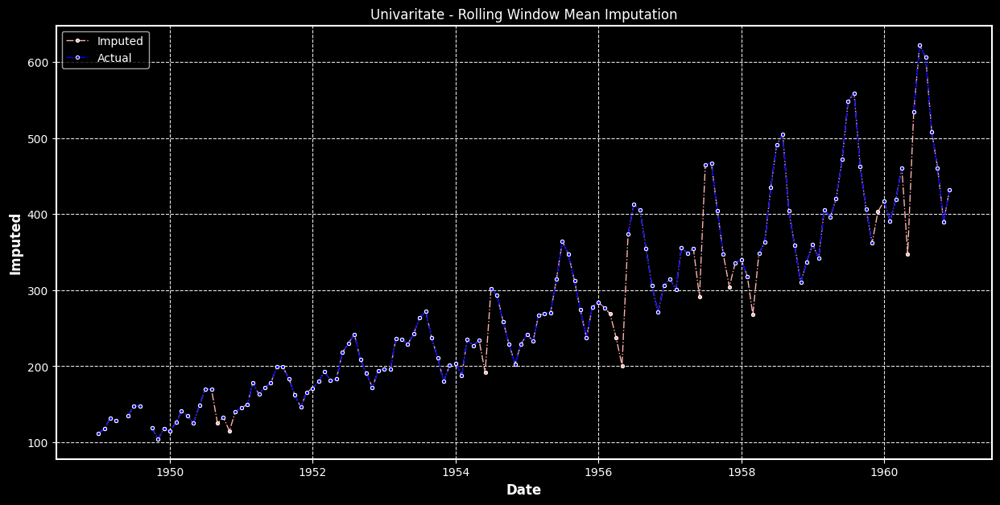

In [825]:
fillna_imputeUV = airgap_data.copy()
fillna_imputeUV.columns=['Actual']

fillna_imputeUV['Imputed'] = fillna_imputeUV.Actual.fillna(0).rolling(window=10).mean()
fillna_imputeUV['Imputed'] = fillna_imputeUV.apply(lambda x : \
                                                   x.Imputed if pd.isna(x.Actual) else x.Actual, axis=1)

get_uv_impplot(fillna_imputeUV, title='Univaritate - Rolling Window Mean Imputation')

<b>Forward and Backward Fill</b>

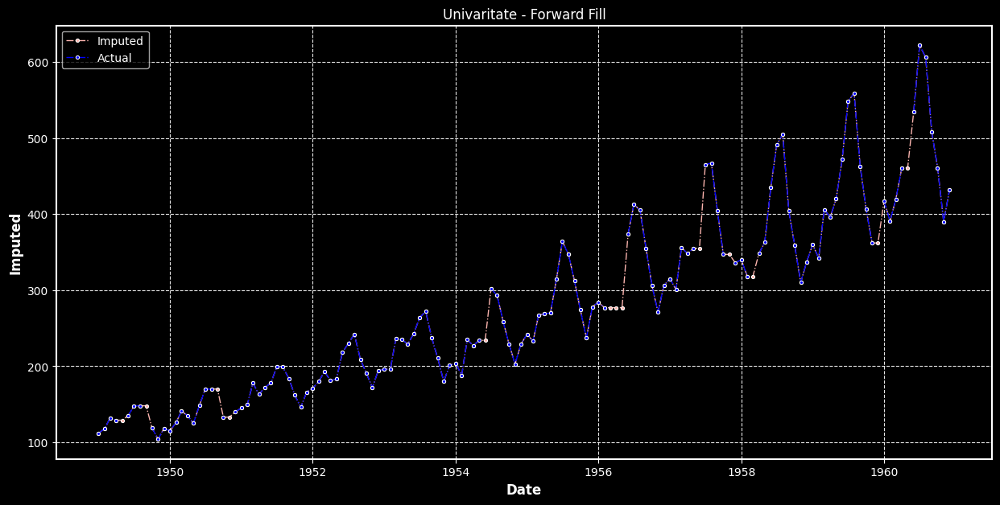

In [826]:
ffill_imputeUV = airgap_data.copy()
ffill_imputeUV.columns=['Actual']
ffill_imputeUV['Imputed'] = ffill_imputeUV.Actual.ffill()

get_uv_impplot(ffill_imputeUV, title='Univaritate - Forward Fill')

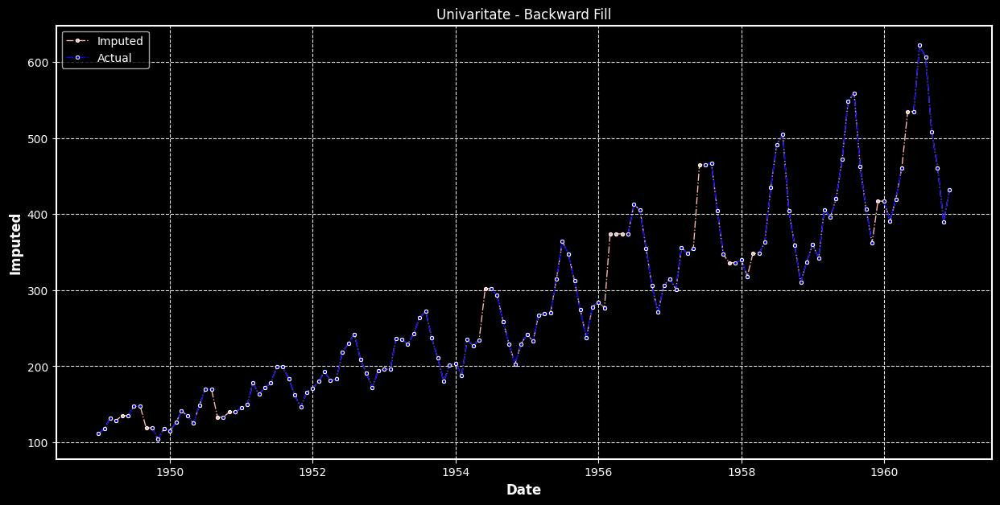

In [827]:
bfill_imputeUV = airgap_data.copy()
bfill_imputeUV.columns=['Actual']
bfill_imputeUV['Imputed'] = bfill_imputeUV.Actual.bfill()

get_uv_impplot(bfill_imputeUV, title='Univaritate - Backward Fill')

<b>Interpolation</b>

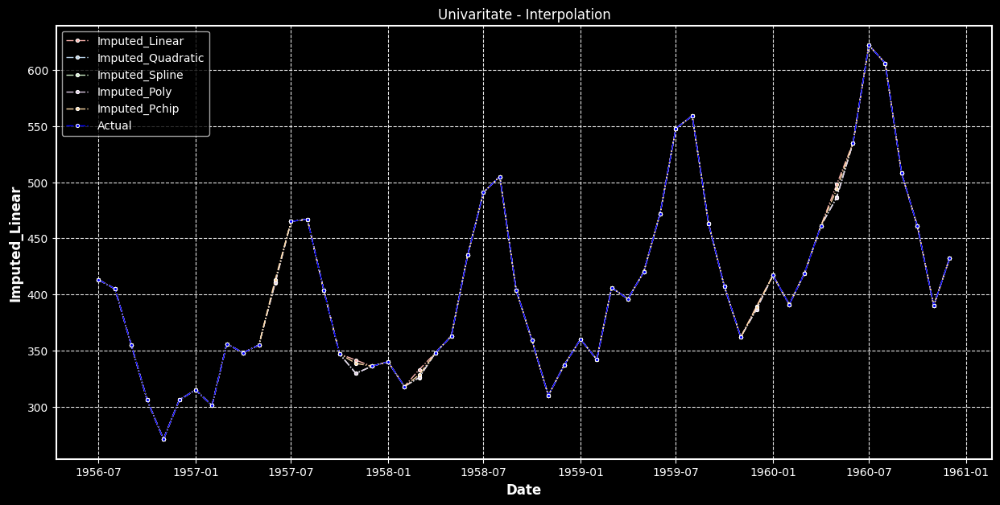

In [835]:
interp_imputeUV = airgap_data.copy()
interp_imputeUV.columns=['Actual']
interp_imputeUV['Imputed_Linear'] = interp_imputeUV.Actual.interpolate(method='linear')
interp_imputeUV['Imputed_Quadratic'] = interp_imputeUV.Actual.interpolate(method='quadratic')
interp_imputeUV['Imputed_Spline'] = interp_imputeUV.Actual.interpolate(method='spline', order=2)
interp_imputeUV['Imputed_Poly'] = interp_imputeUV.Actual.interpolate(method='polynomial', order=2)
interp_imputeUV['Imputed_Pchip'] = interp_imputeUV.Actual.interpolate(method='pchip')

get_uv_impplot(interp_imputeUV[90:], title='Univaritate - Interpolation')

<b>Now, lets calculate which method of interpolation is the best for the given dataset?</b>

In [841]:
imp_check = airgap_data.copy()
imp_check.columns=['Actual']
imp_check['Imputed_Linear'] = imp_check.Actual.interpolate(method='linear')
imp_check['Imputed_Quadratic'] = imp_check.Actual.interpolate(method='quadratic')
imp_check['Imputed_Spline'] = imp_check.Actual.interpolate(method='spline', order=2)
imp_check['Imputed_Poly'] = imp_check.Actual.interpolate(method='polynomial', order=2)
imp_check['Imputed_Pchip'] = imp_check.Actual.interpolate(method='pchip')
imp_check['Imputed_bfill'] = imp_check.Actual.bfill()
imp_check['Imputed_ffill'] = imp_check.Actual.ffill()

imp_check['Imputed_Rolling'] = imp_check.Actual.fillna(0).rolling(window=10).mean()
imp_check['Imputed_Rolling'] = imp_check.apply(lambda x : x.Imputed_Rolling if pd.isna(x.Actual) else x.Actual,
                                               axis=1)
imp_check['Imputed_Meanfill'] = imp_check.Actual.fillna(imp_check.Actual.mean())
imp_check['Imputed_Medialfill'] = imp_check.Actual.fillna(imp_check.Actual.median())
imp_check.head()


,Actual,Imputed_Linear,Imputed_Quadratic,Imputed_Spline,Imputed_Poly,Imputed_Pchip,Imputed_bfill,Imputed_ffill,Imputed_Rolling,Imputed_Meanfill,Imputed_Medialfill
Date,,,,,,,,,,,
1949-01-01,112.0,112.0,112.000000,112.000000,112.000000,112.000000,112.0,112.0,112.0,112.000000,112.0
1949-02-01,118.0,118.0,118.000000,118.000000,118.000000,118.000000,118.0,118.0,118.0,118.000000,118.0
1949-03-01,132.0,132.0,132.000000,132.000000,132.000000,132.000000,132.0,132.0,132.0,132.000000,132.0
1949-04-01,129.0,129.0,129.000000,129.000000,129.000000,129.000000,129.0,129.0,129.0,129.000000,129.0
1949-05-01,NaN,132.0,127.971802,128.276743,127.971802,130.631465,135.0,129.0,NaN,279.816794,259.0


In [871]:
sse_df = pd.DataFrame(columns=['SSE'])
actual_data = airpassengers_data.copy()
actual_data.index = actual_data.index.to_timestamp()
sse_df.index.name = 'Imputation Type'
for ecol in [k for k in imp_check.columns if 'Imputed' in k]:
    imputation_name = " ".join(ecol.split('_'))
    score = ((imp_check[ecol]-actual_data['Passengers'])**2).sum()
    sse_df.loc[imputation_name, 'SSE'] = score


In [872]:
sse_df

,SSE
Imputation Type,
Imputed Linear,5337.62
Imputed Quadratic,4649.13
Imputed Spline,4759.91
Imputed Poly,4649.13
Imputed Pchip,5231.62
Imputed bfill,20455
Imputed ffill,16349
Imputed Rolling,69469
Imputed Meanfill,172642


<b>But do you think this is the right way to assess which `Interpolation` method to use?</b>

Ans) No!, we wont have the actual data to compare it with, Which Interpolation method to use is something that is very specific to the `Domain Knowledge` of the Time Series problem we are working on.

<b>Imputing missing data in Multivariate Dataset</b>

- Random Forest Imputation using Proximity Matrix, **Interesting Course :** [Intro To Machine Learning by Jeremy Howards & Rachel](https://course18.fast.ai/ml.html)
- KNN Imputation : **Interesting Read :** [sklearn docs](https://scikit-learn.org/stable/modules/impute.html#nearest-neighbors-imputation)

In [887]:
from missingpy import MissForest, KNNImputer
imputer = MissForest()
X_imputed = imputer.fit_transform(housepmiss_data.values)
X_imputed_DF = pd.DataFrame(X_imputed, columns=housepmiss_data.columns)

Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
Iteration: 4


In [889]:
import numpy as np
from sklearn.impute import KNNImputer
nan = np.nan
imputer = KNNImputer(n_neighbors=2, weights="uniform")
X_imputed = imputer.fit_transform(housepmiss_data.values)
X_imputed_DF = pd.DataFrame(X_imputed, columns=housepmiss_data.columns)
X_imputed_DF

,crim,zn,indus,chas,nox,rm,age,dis,rad,tax,ptratio,b,lstat,medv
0,0.00632,18.0,2.31,0.0,0.538,6.575,65.2,4.0900,1.0,296.0,15.3,396.90,4.98,24.0
1,0.02731,0.0,7.07,0.0,0.469,6.421,78.9,4.9671,2.0,242.0,17.8,396.90,9.14,21.6
2,0.02729,0.0,7.07,0.0,0.469,7.185,61.1,4.9671,2.0,242.0,17.8,392.83,4.03,34.7
3,0.03237,0.0,2.18,0.0,0.458,6.998,45.8,6.0622,3.0,222.0,18.7,394.63,2.94,33.4
4,0.06905,0.0,2.18,0.0,0.458,7.147,54.2,6.0622,3.0,222.0,18.7,396.90,5.33,36.2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
501,0.06263,0.0,11.93,0.0,0.573,6.593,69.1,2.4786,1.0,273.0,21.0,391.99,9.67,22.4
502,0.04527,0.0,11.93,0.0,0.573,6.120,76.7,2.2875,1.0,273.0,21.0,396.90,9.08,20.6
503,0.06076,0.0,11.93,0.0,0.573,6.976,91.0,2.1675,1.0,273.0,21.0,396.90,5.64,23.9
504,0.10959,0.0,11.93,0.0,0.573,6.794,89.3,2.3889,1.0,273.0,21.0,393.45,6.48,22.0


## Outlier Detection (Anomally Detection)

## Smoothing Operations

 - Moving Average
 - Exponential Smoothing
 - Holt Winter Exponential Smoothing
 - Fourier Smoothing

In [1034]:
smoothedMA_data = beerprod_data.copy()
smoothedMA_data.columns = ['MBP']
smoothedMA_data['SmoothedData'] = np.nan
smoothedMA_data.head()

,MBP,SmoothedData
Month,,
1956-01-01,93.2,NaN
1956-02-01,96.0,NaN
1956-03-01,95.2,NaN
1956-04-01,77.1,NaN
1956-05-01,70.9,NaN


<b>Moving Average Smoothing</b>

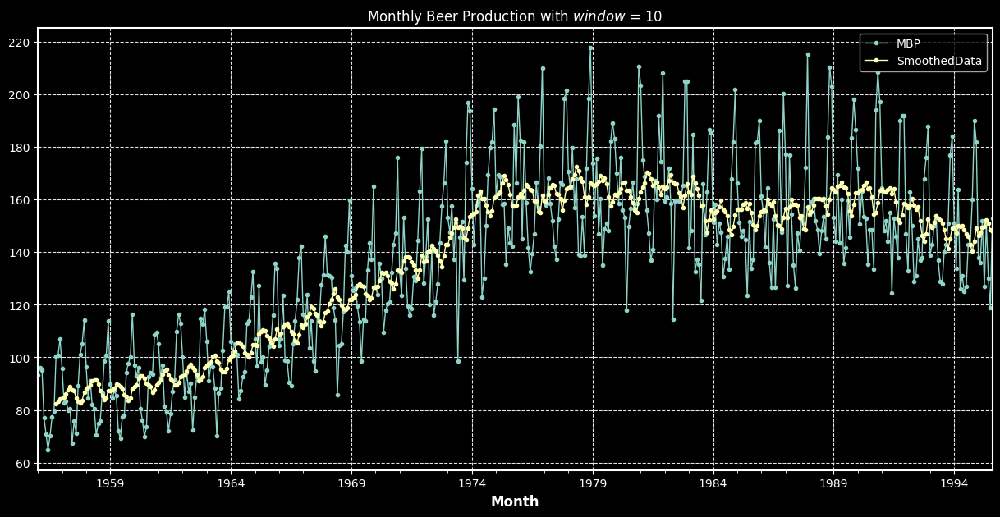

In [920]:
window_size = 10
smoothedMA_data['SmoothedData'] = smoothedMA_data.MBP.rolling(window=window_size).mean()

_=smoothedMA_data.plot(title=f'Monthly Beer Production with $window$ = {window_size}', 
                       linestyle='-', marker='o', markersize=3)

<b>Exponential Smoothing</b>

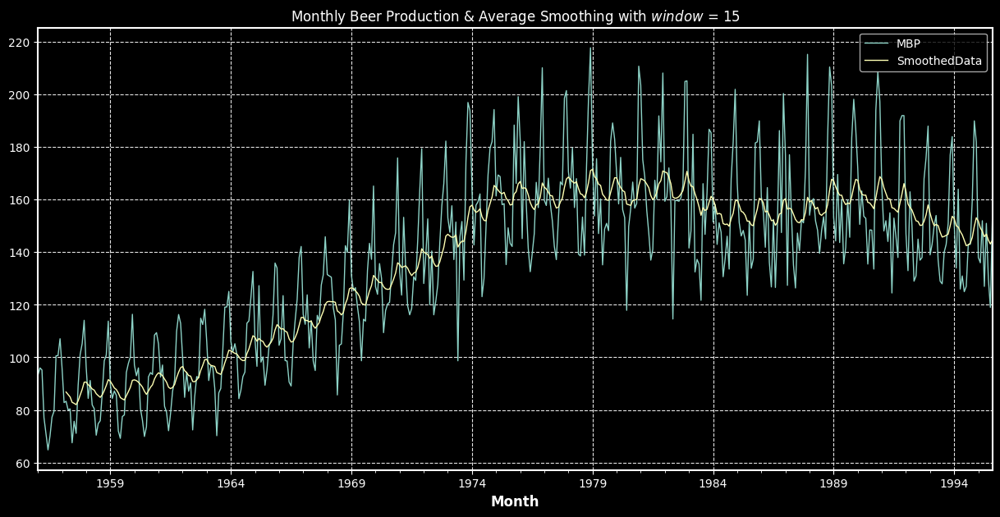

In [1009]:
# Custom Definition of weights
window_size = 15
win_weights = np.diff(np.geomspace(1,2, window_size+1)-1)
def get_exp(x):
    global win_weights
    return sum(x.values*win_weights)

rolling = smoothedMA_data.MBP.rolling(window=window_size)
smoothedMA_data['SmoothedData'] = rolling.apply(lambda x : get_exp(x))

_=smoothedMA_data.plot(title=f'Monthly Beer Production & Average Smoothing with $window$ = {window_size}', 
                       linestyle='-',)

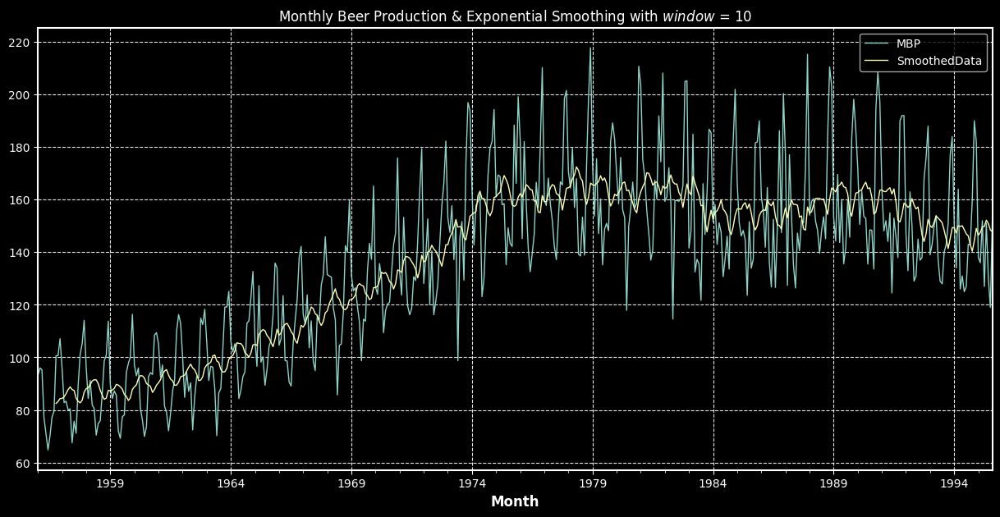

In [1011]:
# pandas ewm
window_size = 10
smoothedMA_data['SmoothedData'] = smoothedMA_data.MBP.rolling(window=window_size).mean()

_=smoothedMA_data.plot(title=f'Monthly Beer Production & Exponential Smoothing with $window$ = {window_size}', 
                       linestyle='-')

<b>Fourier Smoothing</b>

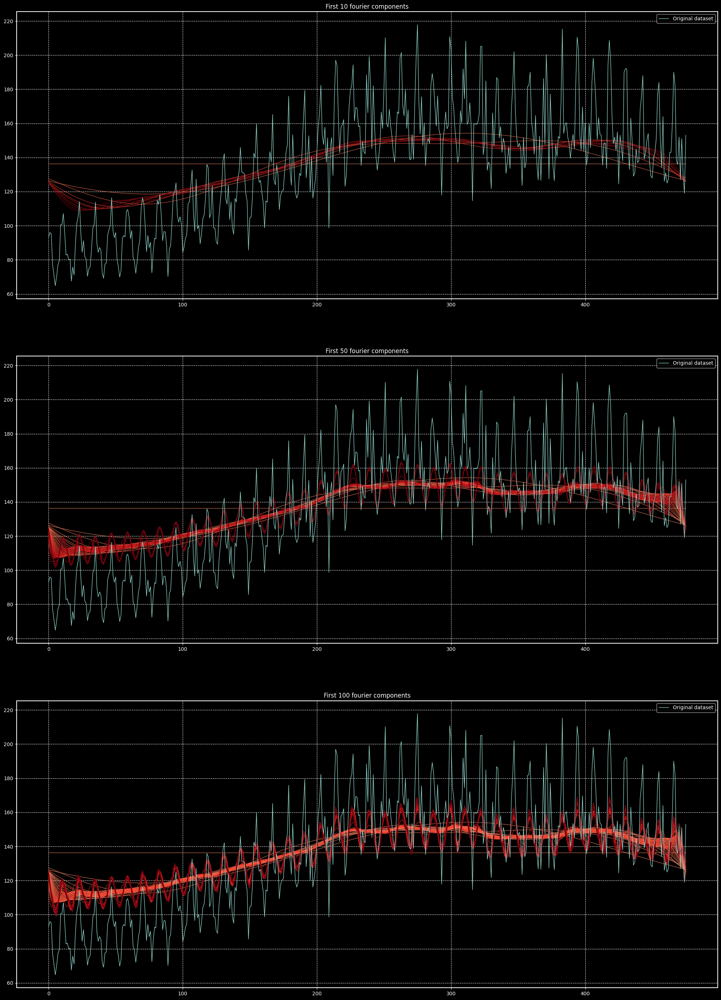

In [1048]:
# Inspired from : https://dsp.stackexchange.com/a/49233/47462

y = smoothedMA_data.MBP.values
n = len(y)
x = np.linspace(start=0, stop=n-1, num=n)

fig, axes  = plt.subplots(3,1, figsize=(25,35))

COMPONENTS = [10, 50, 100]

for idx, c in enumerate(COMPONENTS):
    colors = np.linspace(start=100, stop=255, num=c)
    for i in range(c):
        Y = np.fft.fft(y)
        np.put(Y, range(i+1, n), 0.0)
        ifft = np.fft.ifft(Y)
        axes[idx].plot(x, ifft.real, color=plt.cm.Reds(int(colors[i])), alpha=.70)
        smoothedMA_data['SmoothedData'] = ifft.real

    axes[idx].set_title("First {c} fourier components".format(c=c))
    axes[idx].plot(x,y, label="Original dataset")
    axes[idx].grid(linestyle='dashed')
    axes[idx].legend()


## Transformation & Adjustment Operations

We usually induldge in the adjustments and transformations because we want to make our time series data much more smoother and simpler, as simpler patterns usually make for much more accurate forecast.

- Calendar Adjustments
- Population Adjustments
- Inflation Adjustments
- Power Transforms
- Differencing
- Standardization
- Normalization


[Data transformations and forecasting models: what to use and when](https://people.duke.edu/~rnau/whatuse.htm)

In [1374]:
def get_transformed_plot(data, title):
    data=data.reset_index().copy()
    fig, axes = plt.subplots(2,1, figsize=(15,12))
    adjCol = [k for k in data.columns if 'Adjusted' in k or 'Transformed' in k][0]
    axes[0].plot(data.index, data.Actual)
    axes[1].plot(data.index, data[adjCol], color='lightgray')
    fig.suptitle(title, fontsize=20)
    plt.close()
    return fig

### Calendar Adjustment's
- Removes the variation in the dataset due to the intermittent variation in frequency related properties for ex :  different `number of days in a month`
- Makes time series much more simpler to forecast

In [1327]:
transformData1 = beerprod_data.copy()
transformData1.columns = ['Actual']

transformData2 = milkprod_data.copy()
transformData2.columns = ['Actual']


In [1328]:
transformData1['CalendarAdjusted'] = transformData1.Actual/transformData1.index.daysinmonth
transformData2['CalendarAdjusted'] = transformData2.Actual/transformData2.index.daysinmonth

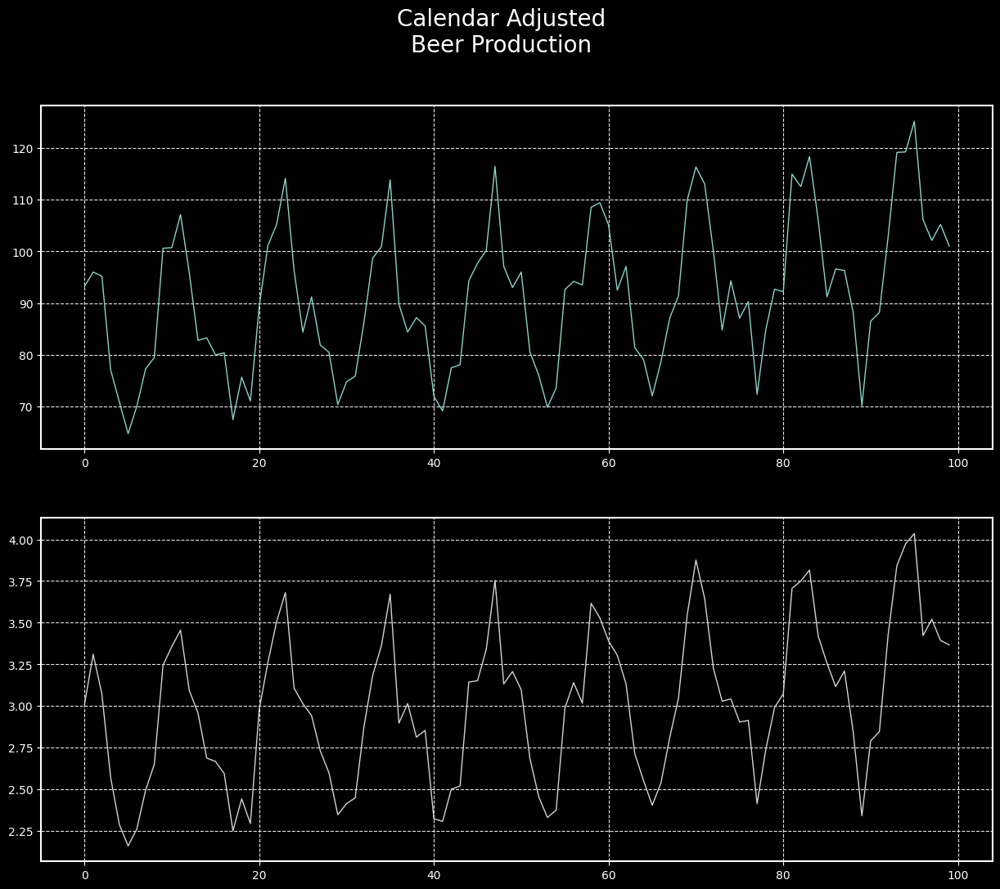

In [1329]:
get_transformed_plot(transformData1[:100], 'Calendar Adjusted\nBeer Production')

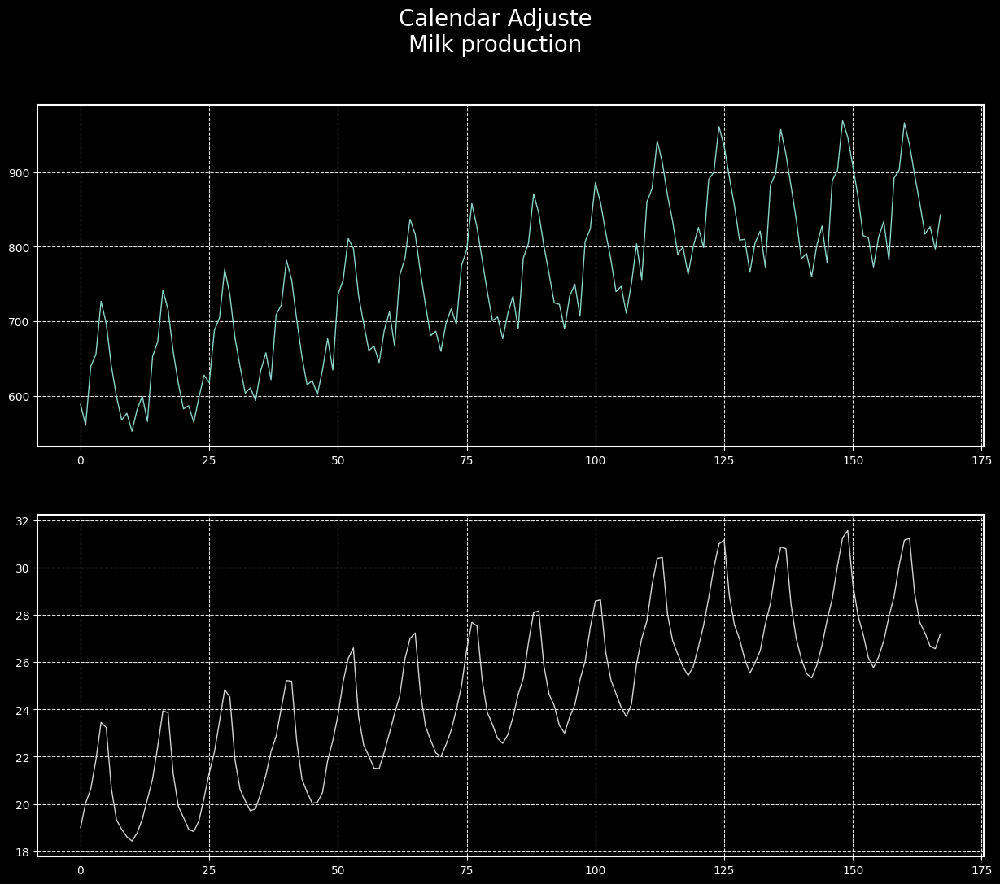

In [1330]:
get_transformed_plot(transformData2, 'Calendar Adjuste\nMilk production')

### Population Adjustment's

- Adjustments accounting for the changes in population, for example Number of Schools in the Country. That time series will carry more meaning if it were to be in the terms of Per Capita

In [1235]:
popenergy_data.head()

,Population,Renewable_Energy_TWh,NonRenewable_Energy_TWh,Nuclear_Energy_TWh
1960-01-01,3.067248e+10,9578,31011,0
1965-01-01,3.372133e+10,10103,40552,26
1966-01-01,3.446703e+10,10222,42689,34
1967-01-01,3.520994e+10,10300,44327,41
1968-01-01,3.596666e+10,10412,47020,52


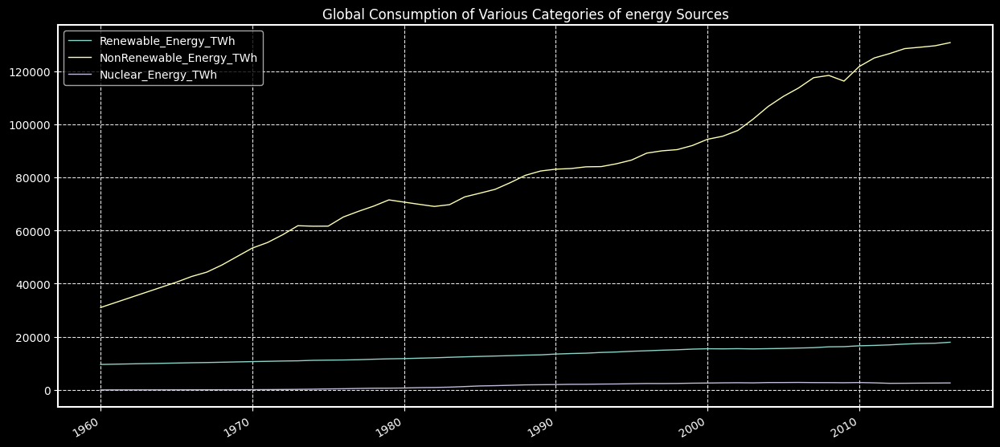

In [1238]:
_=popenergy_data.iloc[:,1:].plot(title='Global Consumption of Various Categories of energy Sources')

In [1247]:
popenergy_data['Renewable_Energy_TWh'] = popenergy_data['Renewable_Energy_TWh']/popenergy_data['Population']
popenergy_data['NonRenewable_Energy_TWh'] = popenergy_data['NonRenewable_Energy_TWh']/popenergy_data['Population']
popenergy_data['Nuclear_Energy_TWh'] = popenergy_data['Nuclear_Energy_TWh']/popenergy_data['Population']
popenergy_data.head()

,Population,Renewable_Energy_TWh,NonRenewable_Energy_TWh,Nuclear_Energy_TWh
1960-01-01,3.067248e+10,1.018069e-17,3.296234e-17,0.000000e+00
1965-01-01,3.372133e+10,8.884663e-18,3.566177e-17,2.286462e-20
1966-01-01,3.446703e+10,8.604548e-18,3.593421e-17,2.862010e-20
1967-01-01,3.520994e+10,8.308194e-18,3.575508e-17,3.307145e-20
1968-01-01,3.596666e+10,8.048854e-18,3.634817e-17,4.019789e-20


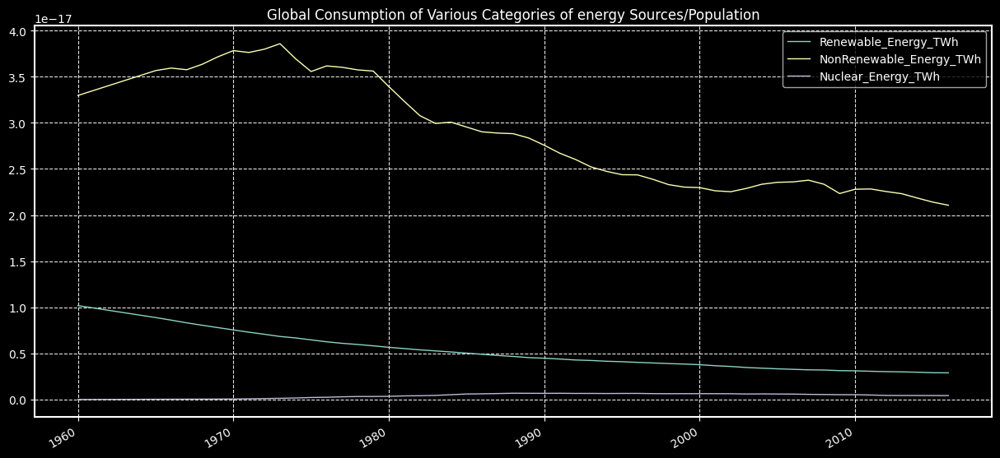

In [1248]:
_=popenergy_data.iloc[:,1:].plot(title='Global Consumption of Various Categories of energy Sources/Population')

### Inflation Adjustments

These adjustments are required when the working with financial data. Some object which costs @ $1,000.00 in 2020 might had costs @ $500.00 in 2005, but it doesnt neccesarily means that the `VALUE` of the object has been appreciated, as it might just be because of the inflation.

In [1365]:
housing_prices = houseprices_data.copy()
housing_prices.index = housing_prices.index.to_timestamp()
usa_cpi = usacpi_data[usacpi_data.index>='2008-03-01'].copy()
transformData3 = pd.merge(housing_prices, usa_cpi, left_index=True, right_index=True, how='inner')

In [1367]:
transformData3['Inflation_Adjusted_Price'] = transformData3['Price']/transformData3['CPI']
transformData3 = transformData3[transformData3.Region.isin(['Park Ridge'])]
transformData3 = transformData3.drop(['Region', 'CPI'], axis=1)
transformData3.rename(columns={'Price':'Actual'}, inplace=True)
transformData3.head()

,Actual,Inflation_Adjusted_Price
2008-03-01,373500.0,1749.840711
2008-04-01,370900.0,1733.647437
2008-05-01,343900.0,1597.988922
2008-06-01,366000.0,1683.044932
2008-07-01,349600.0,1596.230412


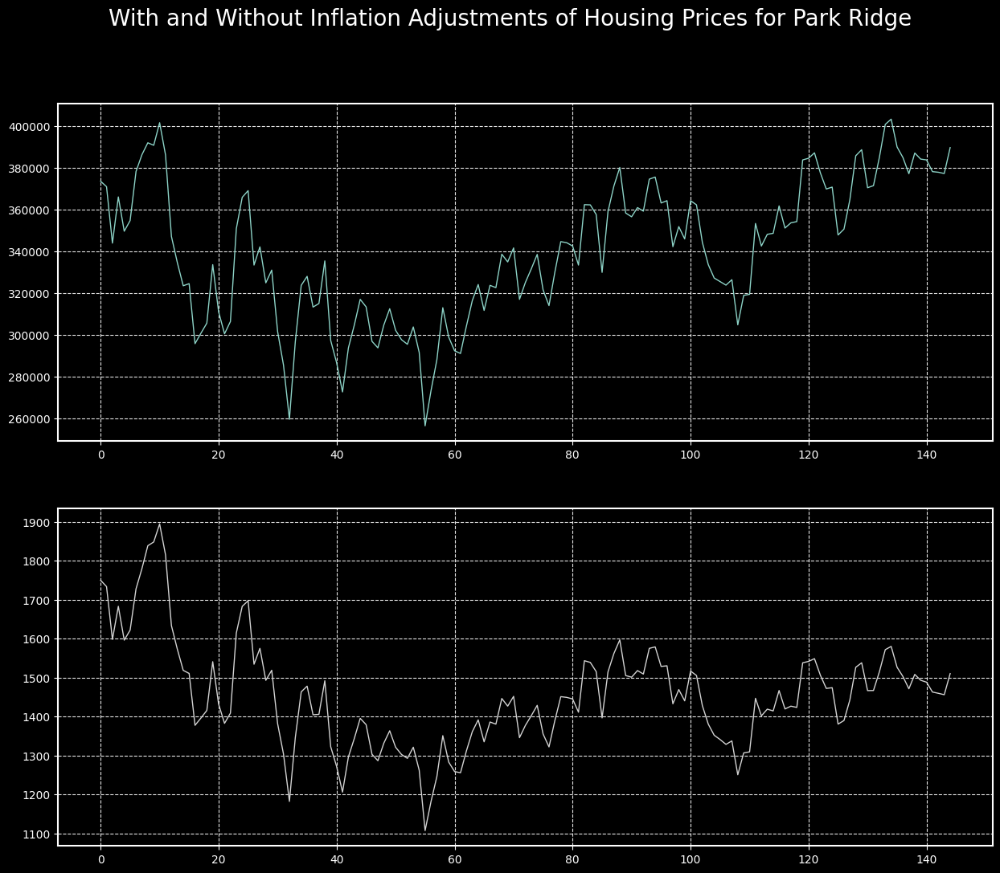

In [1368]:
get_transformed_plot(transformData3, 'With and Without Inflation Adjustments of Housing Prices for Park Ridge')

### Mathematical Transformations

Usually these are the transformations that you'd want to do away with the porblem of `Heteroskedacity` in your dataset, i.e `Variance` of the data changing its scale over time..

These transformations include :-
- Natural Log -
\begin{equation}
    w_{t}=log(y_{t})
\end{equation}
- Square Root, Cube Root
\begin{equation}
    w_{t}=y_{t}^n
\end{equation}
- Box-Cox Transformation -
\begin{equation}
  w_{t}=\begin{cases}
    log(y_{t}), & \text{if $\lambda=0;$}\\
    (y_{t}^\lambda-1)/{\lambda}, & \text{otherwise}
  \end{cases}
\end{equation}



Back Transformations for :-
- Natural Log -
\begin{equation}
    F_{t}=log(f_{t})
\end{equation}
- Square Root, Cube Root
\begin{equation}
    F_{t}=f_{t}^\frac{1}{n}
\end{equation}
- Box-Cox Median Point Forecast-
\begin{equation}
  F_{t}=\begin{cases}
    exp(f_{t}), & \text{if $\lambda=0;$}\\
    (\lambda f_{t}+1)^\frac{1}{\lambda} , & \text{otherwise}
  \end{cases}
\end{equation}
- Box-Cox Mean Point Forecast-
\begin{equation}
  F_{t}=\begin{cases}
    exp(f_{t}) \left [1+\frac{\sigma_{h}^2}{2} \right ], & \text{if $\lambda=0;$}\\
    (\lambda f_{t}+1)^\frac{1}{\lambda} \left [1+\frac{\sigma_{h}^2(1-\lambda)}{2(\lambda f_{t} + 1)^2} \right ], & \text{otherwise}
  \end{cases}
\end{equation}


Where 

$Y_{t}$ : Original Time Series Data

$w_{t}$ : Transformed Time Series Data

$f_{t}$ : Forecasted Time Series Data with Transformations

$F_{t}$ : Back Transformed Time Series data to match the scales of $Y_{t}$

$\sigma_{h}$ : Standard Deviation in the Time series Forecasts.

NOTE : The additional terms in the `Box Cox` Transformations are because of the fact that the simple back transformation will result in the data being Median oriented of the Forecast Distribution, but if we want Mean oriented point forecasts, we will have to use these adjustments



In [1379]:
transformData4 = elecprod_data.copy()
transformData5 = antidiabetic_data.copy()

transformData4.columns = ['Actual']
transformData4.index.name = 'Date'

transformData5.columns = ['Actual']
transformData5.index.name = 'Date'

Try to use power transformations.. `np.sqrt`, `np.power(x,1/3)`

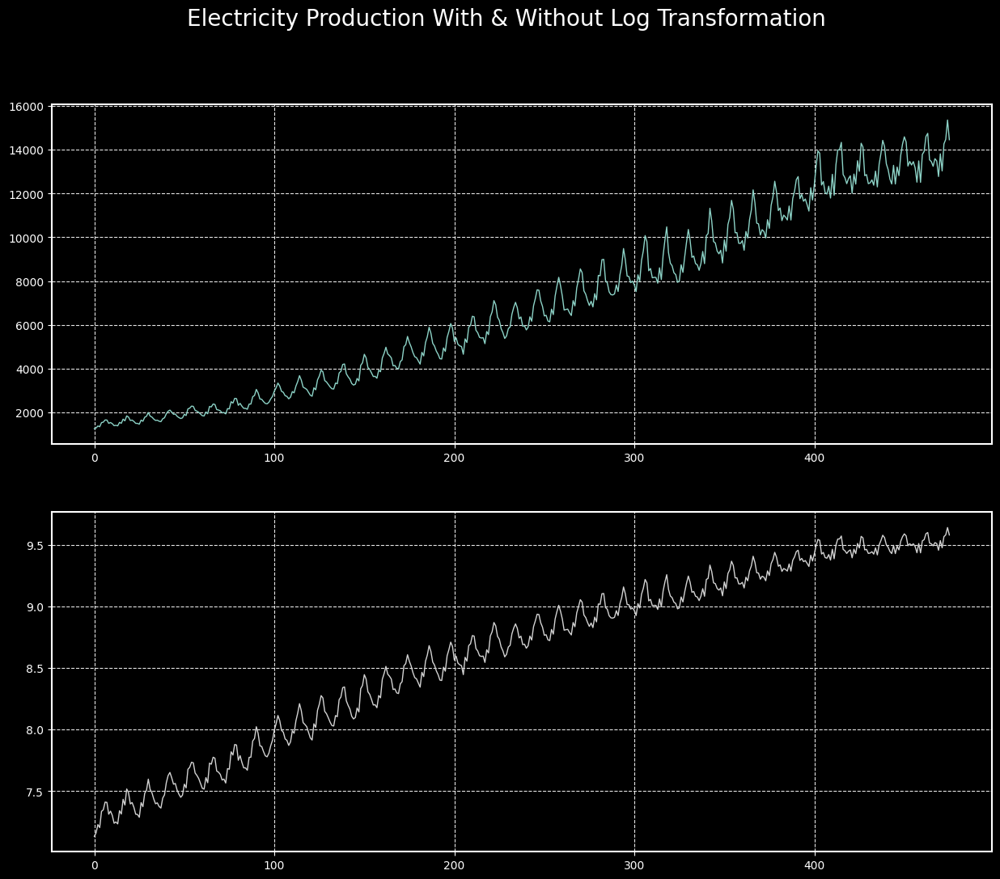

In [1375]:
transformData4['Transformed'] = np.log(transformData4.Actual)
get_transformed_plot(transformData4, 'Electricity Production With & Without Log Transformation')

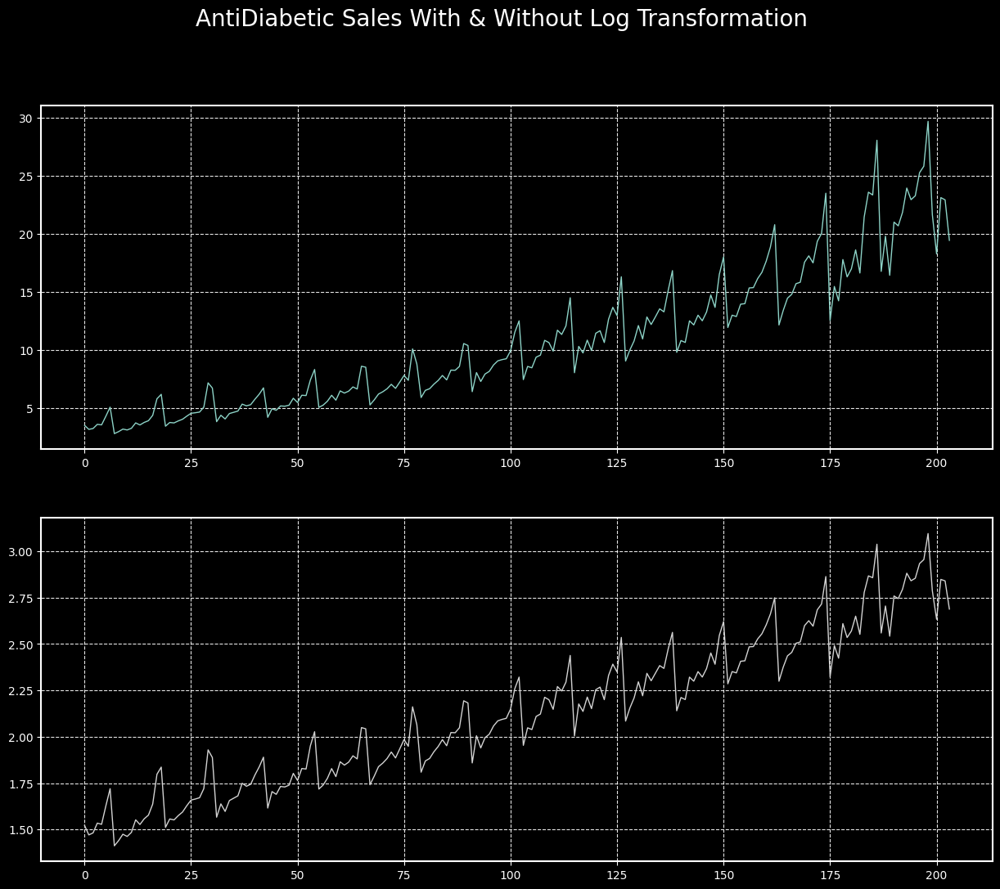

In [1378]:
transformData5['Transformed'] = np.log(transformData5.Actual)
get_transformed_plot(transformData5, 'AntiDiabetic Sales With & Without Log Transformation')

<b>Box - Cox Transformation</b>

In [1380]:
from scipy.stats import boxcox

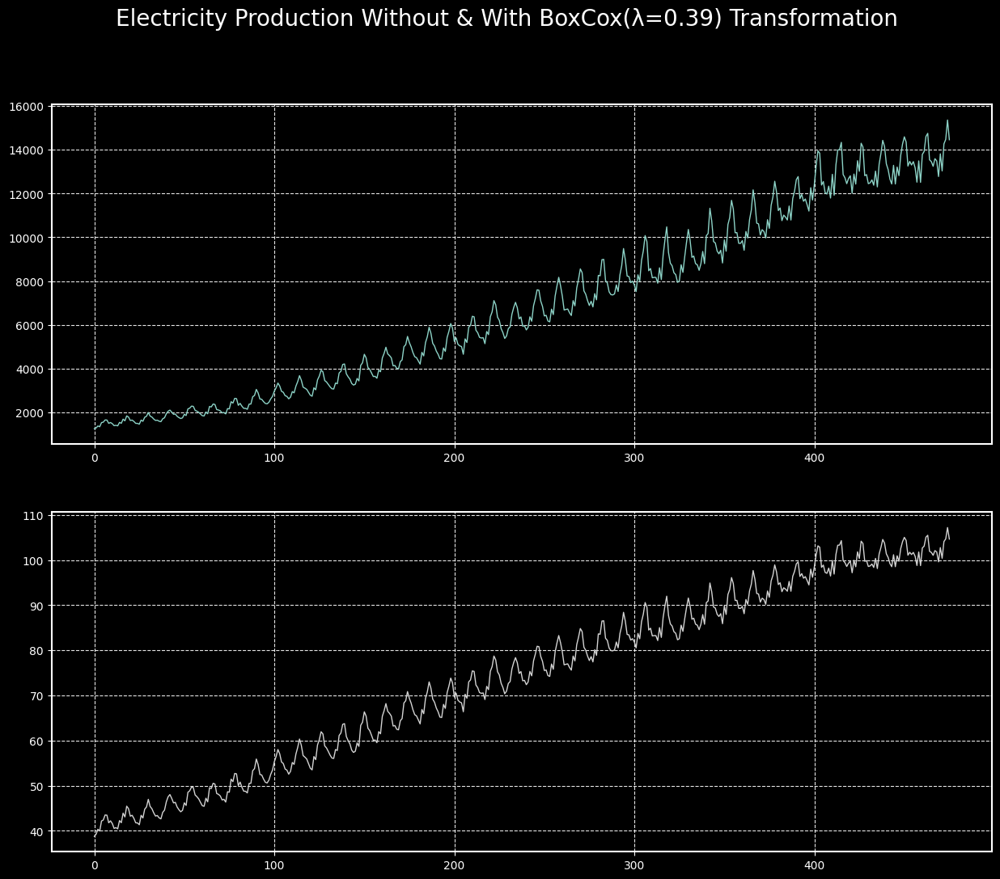

In [1396]:
transformData4['Transformed'], bc_lambda = boxcox(transformData4.Actual)
get_transformed_plot(transformData4,
                     r'Electricity Production Without & With BoxCox(λ={0}) Transformation'.format(round(bc_lambda,3)))


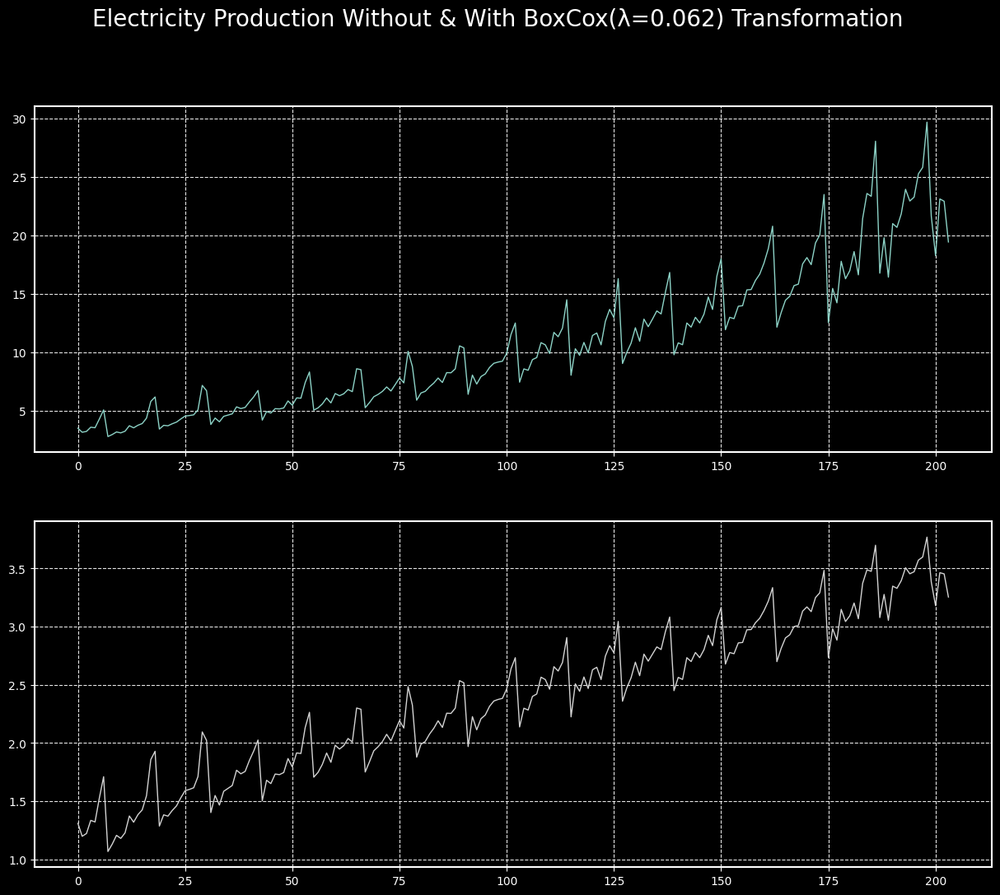

In [1397]:
transformData5['Transformed'], bc_lambda = boxcox(transformData5.Actual)
get_transformed_plot(transformData5,
                     r'Electricity Production Without & With BoxCox(λ={0}) Transformation'.format(round(bc_lambda,3)))



# Time Series Visualisations

- Time Series Plot -> TS Plot
- Seasonal Plot
- Box Plot
- Violin Plot
- ACF & PACF Plot - To be discussed in Next Notebook
- Distribution Plot
- Stacked TS Plot
- Scatter Plot
- Pair Plot

<b>Interesting Gallery : </b> [Seaborn Gallery](https://seaborn.pydata.org/examples/index.html)


## Time Series Plot - TS Plot

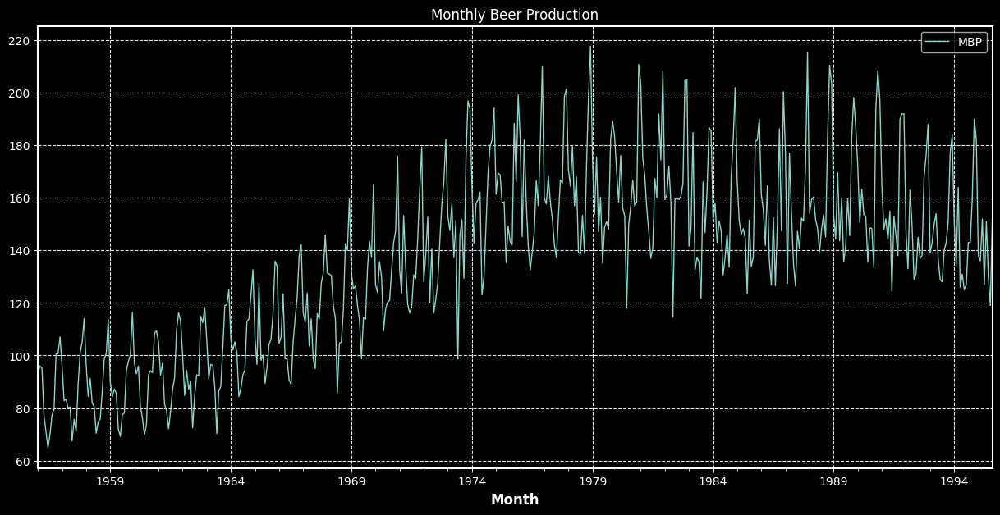

In [1499]:
pltdata = beerprod_data.copy()
pltdata.columns = ['MBP']
_=pltdata.plot(title='Monthly Beer Production')

## Seasonal Plot

In [1501]:
pltdata = beerprod_data.copy()
pltdata.columns = ['MBP']
pltdata['Month'] = pltdata.index.month_name()
pltdata['Year'] = pltdata.index.year
pltdata = pltdata.set_index(['Year', 'Month']).unstack().T
pltdata = pltdata.reset_index().drop(['level_0'], axis=1).set_index('Month')
pltdata.head()

Year,1956,1957,1958,1959,1960,1961,1962,1963,1964,1965,...,1986,1987,1988,1989,1990,1991,1992,1993,1994,1995
Month,,,,,,,,,,,,,,,,,,,,,
April,77.1,80.0,81.9,85.6,80.5,81.4,87.1,96.3,101.0,98.2,...,164.6,154.4,151.9,143.7,153.7,144.1,150.0,154.0,126.0,127.0
August,77.3,71.1,75.9,78.1,92.6,87.1,92.7,88.2,94.4,104.2,...,126.6,140.6,153.5,159.9,148.4,146.0,137.0,140.0,143.0,153.0
December,107.1,114.1,113.8,116.4,109.4,113.0,118.3,125.1,132.7,134.0,...,200.4,215.3,203.3,186.8,197.3,192.0,188.0,184.0,182.0,NaN
February,96.0,82.8,84.4,84.4,93.0,92.5,84.8,91.2,102.1,96.6,...,155.5,127.4,159.3,144.3,150.6,148.1,133.0,143.0,134.0,136.0
January,93.2,95.9,96.3,89.8,97.1,105.1,100.0,106.0,106.1,106.9,...,161.2,177.2,154.1,153.3,172.0,164.4,147.0,139.0,151.0,138.0


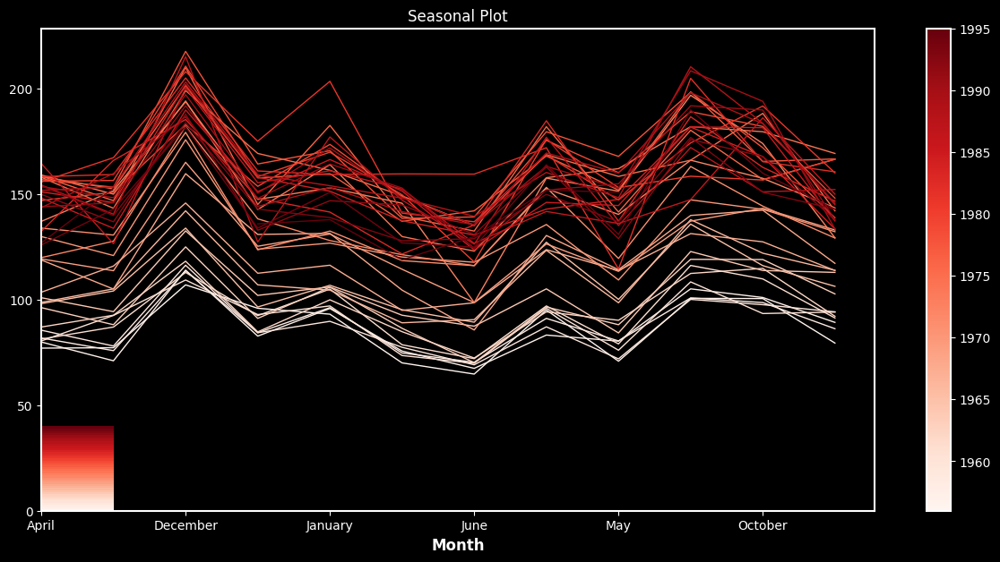

In [1503]:
fig, axes = plt.subplots()
plot=pltdata.plot(title='Seasonal Plot', cmap='Reds', ax=axes, legend=None)
plot = axes.pcolor(pd.DataFrame(pltdata.columns.astype(int)), cmap='Reds')
_=fig.colorbar(plot)

## Box Plot

In [1508]:
pltdata = beerprod_data.copy()
pltdata.columns = ['MBP']
pltdata['Month'] = pltdata.index.month_name()
pltdata['Year'] = pltdata.index.year
pltdata.head()

,MBP,Month,Year
Month,,,
1956-01-01,93.2,January,1956
1956-02-01,96.0,February,1956
1956-03-01,95.2,March,1956
1956-04-01,77.1,April,1956
1956-05-01,70.9,May,1956


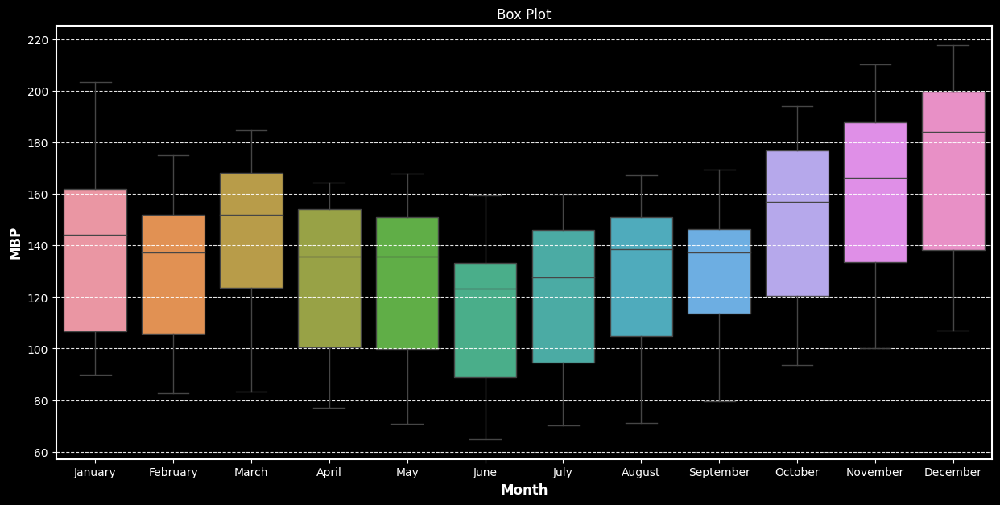

In [1514]:
_=sns.boxplot(x='Month', y='MBP', data=pltdata)
_=plt.title('Box Plot')

## Violin Plot

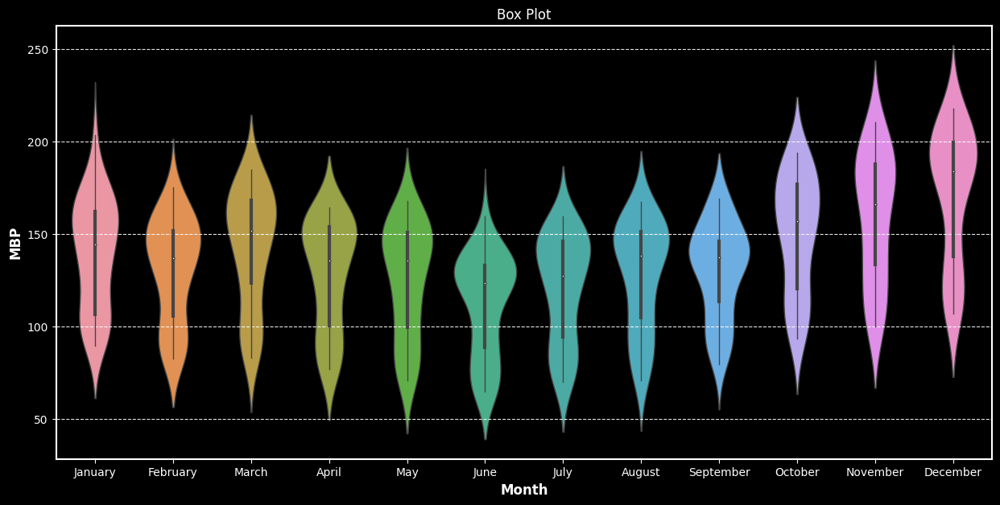

In [1515]:
_=sns.violinplot(x='Month', y='MBP', data=pltdata)
_=plt.title('Box Plot')

## Distribution Plot

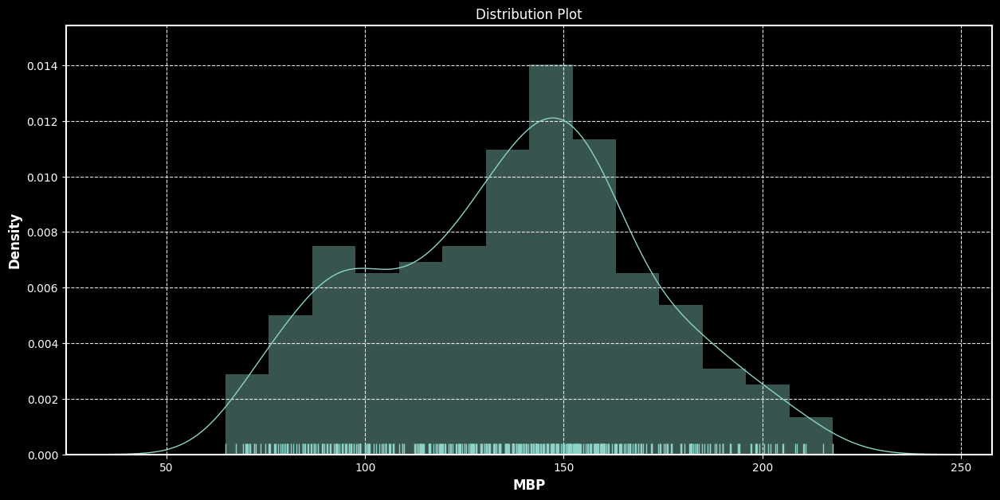

In [1524]:
_=sns.distplot(pltdata.MBP, rug=True)
_=plt.title('Distribution Plot')

## Stacked TS Plots

In [1616]:
pltdata = visitors5r_data.copy()
regions = pltdata.Regions.unique()[:5]

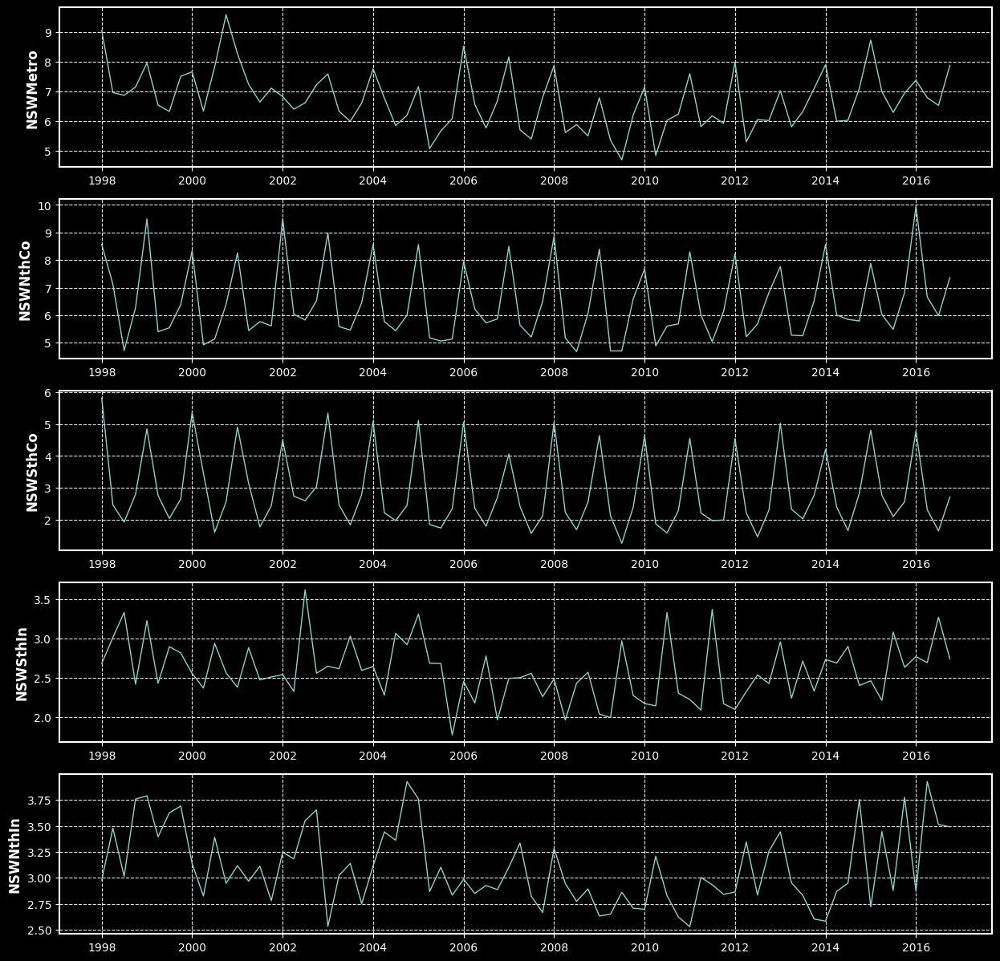

In [1565]:
fig, axes = plt.subplots(len(regions), 1, figsize=(15,15))

for eregion, eax in zip(regions, axes.flatten()):
    _data = pltdata[pltdata.Regions==eregion].copy().drop('Regions', axis=1)
    eax.plot(_data)
    eax.set_ylabel(eregion)
    

## Scatter Plot

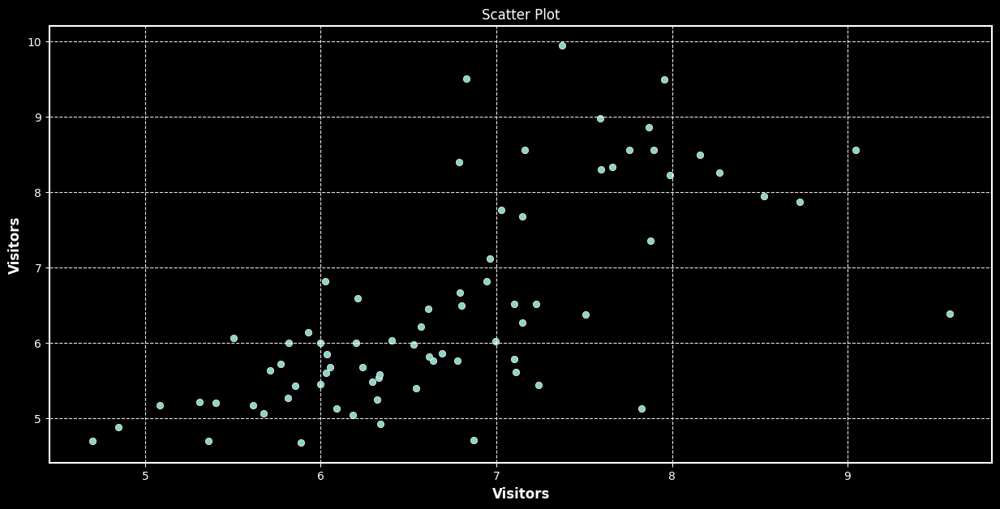

In [1617]:
xdata = pltdata[pltdata.Regions=='NSWMetro'].Visitors
ydata = pltdata[pltdata.Regions=='NSWNthCo'].Visitors

_=sns.scatterplot(xdata, ydata, x_jitter=True)
_=plt.title('Scatter Plot')

## Joint Plot

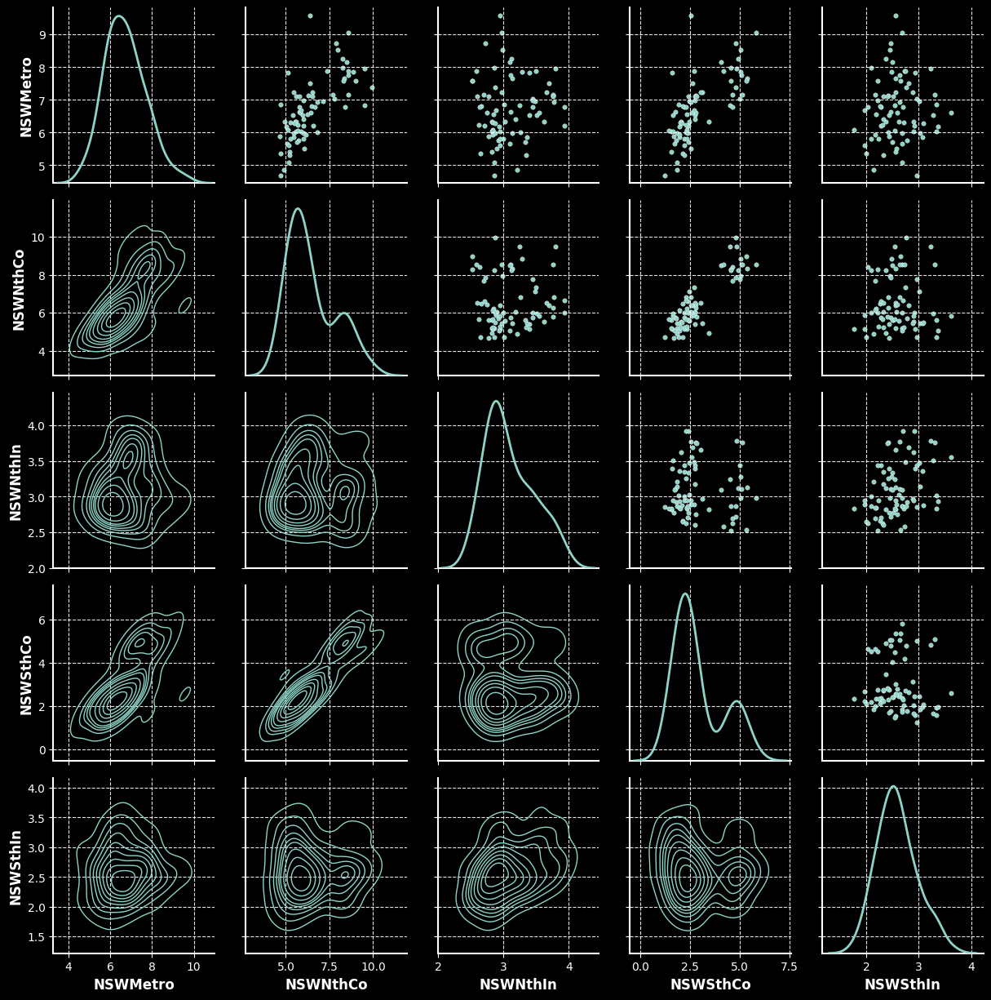

In [1618]:
pltdata=pltdata.reset_index().pivot('index','Regions','Visitors').iloc[:,:5]

g = sns.PairGrid(pltdata, diag_sharey=False)
g.map_upper(sns.scatterplot, s=15)
g.map_lower(sns.kdeplot)
_=g.map_diag(sns.kdeplot, lw=2)

# Time Series Decomposition

Time Series Components : 

- <b>Trend</b> : It is the component which reflect relatively longer period of `increase` or `decrease` in the data.
- <b>Seasonality</b> : Seasonality is the component which reflects the effect of `Calendar` attributed in the data, i.e effect of Weekdays, Months, Day of the Week. etc. This pattern usually adheres to regular frequency.
- <b>Cyclicity</b> : Cyclicity is probably the harder of all the components to figure out, which generally is attributed to the fact that it is not that periodic. It is generally a longer term seasonality pattern.
- <b>Noise or Residual</b> : Once the above three components have been identified, whatever is left is `Noise`.

Decomposition Methods:

- Classical Decomposition, Additive : 
\begin{equation}
  Y_{t} = T_{t} + S_{t} + R_{t}
\end{equation}
- Classical Decomposition, Multiplicative : 
\begin{equation}
  Y_{t} = T_{t}*S_{t}*R_{t}
\end{equation}
    
- STL : [StatsModel - Decomposition](https://www.statsmodels.org/stable/examples/notebooks/generated/stl_decomposition.html)

- X11 : [The X-11 Method](http://www.christophsax.com/x13story/x11.pdf)

- SEATS :  [The X-13 Method](http://course1.winona.edu/bdeppa/FIN%20335/Handouts/Time_Series_Decomposition.html)

Where

$Y_{t}$ : Actual Time Series

$T_{t}$ : Trend Component of the Time Series;
$S_{t}$ : Seasonal Component of the Time Series;
$R_{t}$ : Residual Component

    
[What is the difference between Period Cycle and Seasonality](https://stats.stackexchange.com/questions/234492/what-is-the-difference-between-period-cycle-and-seasonality)

[Cyclic & Seasonal Time Series - Rob.J.Hyndman](https://robjhyndman.com/hyndsight/cyclicts/)

<b>Creating a Random Dataset</b>

In [1876]:

def get_decompose_plot(data):
    data = data.copy()
    data.index.name = ''
    grid = plt.GridSpec(4, 2, wspace=0.1, hspace=0.5)
    series_ax = plt.subplot(grid[0:2, :])
    series_ax.set_title('Time Series')
    
#     ts_trnsfrm, blambda = boxcox(data['ts'])
#     data['ts'] = pd.Series(ts_trnsfrm, name='ts', index=data['ts'].index)
    data['ts'].plot(ax=series_ax)

    trend_ax = plt.subplot(grid[2, 0])
    trend_ax.set_title('Trend Series')
    data['Trend'].plot(ax=trend_ax)

    cycl_ax = plt.subplot(grid[2, 1])
    cycl_ax.set_title('Cyclic Component')
    data['Cyclicity'].plot(ax=cycl_ax)

    seas_ax = plt.subplot(grid[3, 0])
    seas_ax.set_title('Seasonal Component')
    data['Seasonality'].plot(ax=seas_ax)

    resid_ax = plt.subplot(grid[3, 1])
    resid_ax.set_title('Residuals/Noise')
    data['Residual'].plot(ax=resid_ax)
        
    return grid


def generat_randomtsdata(tstart = '1990-01-01', tend = '2020-01-01', plot=False):
    rows = (pd.to_datetime(tend)-pd.to_datetime(tstart)).days+1
    simData = pd.DataFrame(columns=['Trend',  'Cyclicity', 'Seasonality', 'Residual'],
                           index=pd.date_range(tstart, tend, freq='1D'))
    
    _days=np.arange(rows)

    # Trend Componet
    simData['Trend'] = 2*np.arange(rows)/rows
    # Cyclicity Componet
    simData['Cyclicity'] = 0.3*np.sin(3*_days/rows * 2 * np.pi)
    # Seasonality - For Additive
    simData['Seasonality'] = 0.3*np.sin(_days/365 * 2 * np.pi)
    # Seasonality - For Multiplicative
    simData['Seasonality'] = 0.3*(_days/rows)*np.sin(_days/365 * 2 * np.pi)
    # Residual
    simData['Residual'] = np.random.random(rows)/10
    # Time Series
    simData['ts'] = simData.sum(axis=1)
    
    if plot : get_decompose_plot(simData)
    
    return simData


<b>Analysing the Components</b>

,Trend,Cyclicity,Seasonality,Residual,ts
1990-01-01,0.000000,0.000000,0.000000e+00,0.052494,0.052494
1990-01-02,0.000183,0.000516,4.712545e-07,0.069381,0.070080
1990-01-03,0.000365,0.001032,1.884739e-06,0.035666,0.037065
1990-01-04,0.000548,0.001548,4.239615e-06,0.051624,0.053724
1990-01-05,0.000730,0.002064,7.534487e-06,0.015457,0.018259
...,...,...,...,...,...
2019-12-28,1.999087,-0.002580,1.547883e-02,0.009370,2.021356
2019-12-29,1.999270,-0.002064,2.063319e-02,0.076739,2.094578
2019-12-30,1.999452,-0.001548,2.578238e-02,0.097552,2.121238
2019-12-31,1.999635,-0.001032,3.092486e-02,0.065994,2.095522


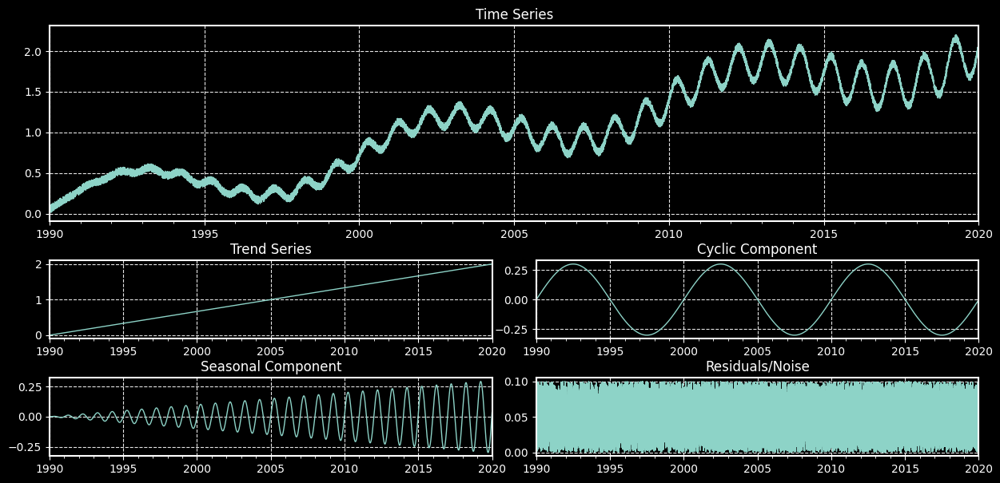

In [1877]:
sim_data = generat_randomtsdata(plot=True)
sim_data

<b>Classical Decomposition - Additive</b>

In [1878]:
from statsmodels.tsa.seasonal import seasonal_decompose

Interesting Note, if you apply log to the Multiplicative equation it simply becomes the Classical Additive Decomposition.

In [1879]:
decompose_obj = seasonal_decompose(milkprod_data.MilkProductionPounds, period=12, extrapolate_trend=True)

decomposeData = pd.DataFrame(columns=['Trend', 'Cyclicity', 'Seasonality', 'Residual', 'ts'],
                             index=milkprod_data.index)
decomposeData['Trend'] = decompose_obj.trend
decomposeData['Seasonality'] = decompose_obj.seasonal
decomposeData['Residual'] = decompose_obj.resid
decomposeData['ts'] = milkprod_data.MilkProductionPounds

GridSpec(4, 2)

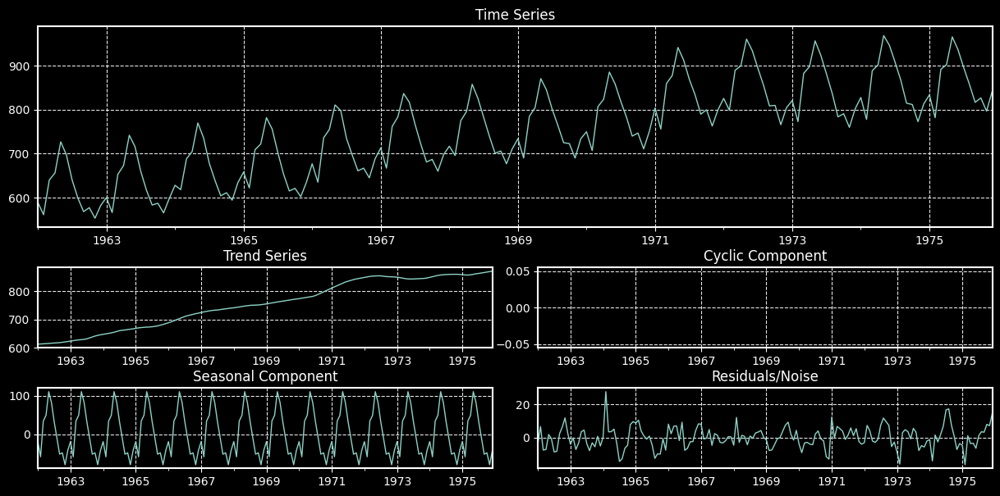

In [1880]:
get_decompose_plot(decomposeData)

<b>Classical Decomposition - Multiplicative</b>

Multiplicative Decompose doesnt work on Negative or NaN data... Can you think as to why?

In [1910]:
decompose_obj = seasonal_decompose(beerprod_data.MBP, period=12,
                                   extrapolate_trend=True, model='multiplicative')

decomposeData = pd.DataFrame(columns=['Trend', 'Cyclicity', 'Seasonality', 'Residual', 'ts'],
                             index=milkprod_data.index)
decomposeData['Trend'] = decompose_obj.trend
decomposeData['Seasonality'] = decompose_obj.seasonal
decomposeData['Residual'] = decompose_obj.resid
decomposeData['ts'] = milkprod_data.MilkProductionPounds

GridSpec(4, 2)

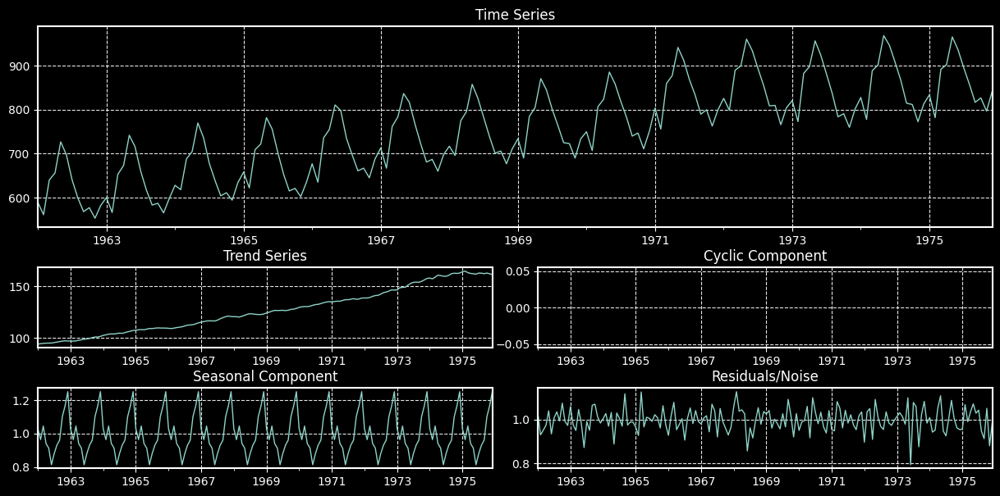

In [1911]:
get_decompose_plot(decomposeData)

<b>STL Decomposition</b>

Time Series uses `LOESS` - Locally Estimated Scatterplot Smoothing


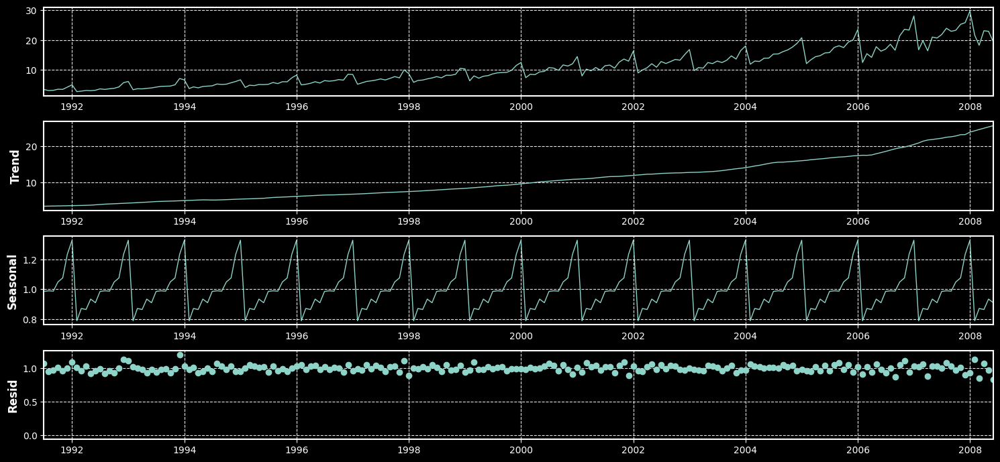

In [1908]:
decompose_obj = seasonal_decompose(antidiabetic_data, period=12,
                                   extrapolate_trend=True, model='multiplicative')

decomposeData = pd.DataFrame(columns=['Trend', 'Cyclicity', 'Seasonality', 'Residual', 'ts'],
                             index=antidiabetic_data.index)
decomposeData['Trend'] = decompose_obj.trend
decomposeData['Seasonality'] = decompose_obj.seasonal
decomposeData['Residual'] = decompose_obj.resid
decomposeData['ts'] = antidiabetic_data.value

fig=decompose_obj.plot()

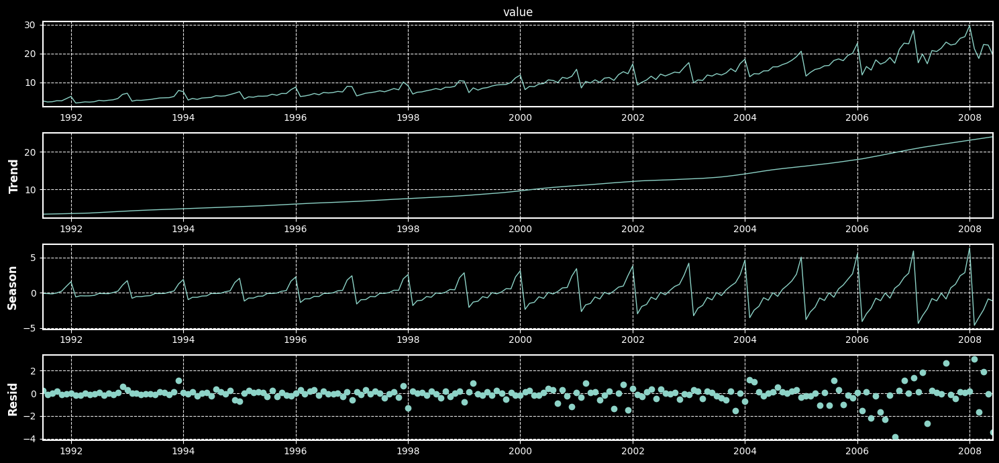

In [1912]:
from statsmodels.tsa.seasonal import STL
stl = STL(antidiabetic_data.value, seasonal=13, robust=True)
res = stl.fit()
fig = res.plot()

# Random Testing Space